# Documentation du Projet : Analyse et Détection des Crimes à Chicago

## Cellule 1 : Importation des Bibliothèques Essentielles

Cette première cellule initialise l'environnement de travail en important toutes les bibliothèques Python nécessaires au projet de machine learning sur les données criminelles de Chicago.

### Dépendances et Utilités

1. **`sys`** : Utilisé pour afficher le chemin de l'interpréteur Python, ce qui permet de vérifier l'environnement d'exécution et d'assurer la reproductibilité du projet.

2. **`pandas` (alias `pd`)** : Bibliothèque fondamentale pour la manipulation et l'analyse des données criminelles. Elle sera utilisée pour :
   - Charger les jeux de données des crimes de Chicago (probablement depuis data.gov ou le portail ouvert de Chicago)
   - Nettoyer et transformer les données criminelles (dates, localisations, types de crimes)
   - Créer des DataFrames pour l'analyse spatio-temporelle des crimes
   - Préparer les caractéristiques pour les modèles prédictifs

3. **`numpy` (alias `np`)** : Bibliothèque pour le calcul scientifique. Elle fournira :
   - Opérations mathématiques sur les données géospatiales
   - Manipulation des arrays pour les caractéristiques numériques
   - Fonctions statistiques pour l'analyse criminelle

4. **`scikit-learn`** : Bibliothèque principale pour le machine learning appliqué à la criminologie :
   - **`train_test_split`** : Pour diviser les données historiques de crimes en ensembles d'entraînement et de test
   - **`mean_absolute_error`, `mean_squared_error`, `r2_score`** : Métriques d'évaluation des modèles de prédiction criminelle
   - **`RandomForestRegressor`** : Pour la prédiction du nombre de crimes par zone/temps (problème de régression)
   - **`PoissonRegressor`** : Modèle particulièrement adapté pour prédire des comptages (nombre de crimes) - distribution de Poisson classique en criminologie

5. **`xgboost` (alias `XGBRegressor`)** : Algorithme avancé de gradient boosting pour :
   - Prédire les hotspots criminels
   - Modéliser les tendances temporelles des crimes
   - Identifier les facteurs de risque avec l'importance des caractéristiques

6. **`matplotlib.pyplot` (alias `plt`)** : Pour la visualisation des données criminelles :
   - Cartes de chaleur (heatmaps) des crimes
   - Tendances temporelles des différents types de crimes
   - Distributions géographiques

7. **`seaborn` (alias `sns`)** : Pour des visualisations statistiques avancées :
   - Analyses de corrélation entre facteurs socio-économiques et criminalité
   - Distributions des types de crimes
   - Visualisations comparatives par quartier

In [1]:
#Important Library¶
import sys
print(sys.executable)


# Manipulation et analyse

import pandas as pd
import numpy as np
import plotly.express as px


# Visualisation
import matplotlib.pyplot as plt
import seaborn as sns

# Prétraitement
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.feature_selection import SelectKBest, mutual_info_classif

# PCA / Réduction de dimension
from sklearn.decomposition import PCA

# Modèles supervisés
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import PoissonRegressor
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression


# Modèles non supervisés
from sklearn.cluster import DBSCAN, KMeans
from sklearn.neighbors import NearestNeighbors
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier


# Évaluation

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    roc_auc_score,
    precision_recall_curve,  # ← AJOUTER CETTE LIGNE
    roc_curve                 # ← ET CELLE-CI pour les courbes ROC
)

# Split train/test
from sklearn.model_selection import train_test_split, learning_curve, TimeSeriesSplit


c:\Users\DELL\Desktop\projet -Machine Learning\.venv\Scripts\python.exe


 Chargement des Données Criminelles de Chicago
Cette cellule charge le jeu de données principal contenant les informations sur les crimes commis à Chicago entre 2015 et 2025.

In [2]:
#Read Data File¶
df =pd.read_csv('crimes_chicago_2015_2025.csv')

 Exploration des Colonnes du Dataset
Cette cellule examine la structure du DataFrame en affichant les noms de toutes les colonnes disponibles dans le jeu de données sur les crimes de Chicago.

In [3]:
df.columns

Index(['ID', 'Case Number', 'Date', 'Block', 'IUCR', 'Primary Type',
       'Description', 'Location Description', 'Arrest', 'Domestic', 'Beat',
       'District', 'Ward', 'Community Area', 'FBI Code', 'X Coordinate',
       'Y Coordinate', 'Year', 'Updated On', 'Latitude', 'Longitude',
       'Location'],
      dtype='object')

## Aperçu Initial des Données :
Cette cellule affiche les 5 premières lignes du DataFrame df contenant les données criminelles de Chicago 2015-2025.

In [4]:
df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,13311263,JG503434,2022-07-29 03:39:00,023XX S TROY ST,1582,OFFENSE INVOLVING CHILDREN,CHILD PORNOGRAPHY,RESIDENCE,True,False,...,25.0,30.0,17,NaN,NaN,2022,04/18/2024 03:40:59 PM,NaN,NaN,NaN
1,13053066,JG103252,2023-01-03 16:44:00,039XX W WASHINGTON BLVD,2017,NARCOTICS,MANUFACTURE / DELIVER - CRACK,SIDEWALK,True,False,...,28.0,26.0,18,NaN,NaN,2023,01/20/2024 03:41:12 PM,NaN,NaN,NaN
2,12131221,JD327000,2020-08-10 09:45:00,015XX N DAMEN AVE,0326,ROBBERY,AGGRAVATED VEHICULAR HIJACKING,STREET,True,False,...,1.0,24.0,03,1162795.0,1909900.0,2020,05/17/2025 03:40:52 PM,41.908418,-87.677407,"(41.908417822, -87.67740693)"
3,11227634,JB147599,2017-08-26 10:00:00,001XX W RANDOLPH ST,0281,CRIM SEXUAL ASSAULT,NON-AGGRAVATED,HOTEL/MOTEL,False,False,...,42.0,32.0,02,NaN,NaN,2017,02/11/2018 03:57:41 PM,NaN,NaN,NaN
4,13203321,JG415333,2023-09-06 17:00:00,002XX N Wells st,1320,CRIMINAL DAMAGE,TO VEHICLE,PARKING LOT / GARAGE (NON RESIDENTIAL),False,False,...,42.0,32.0,14,1174694.0,1901831.0,2023,11/04/2023 03:40:18 PM,41.886018,-87.633938,"(41.886018055, -87.633937881)"


## Traitement Initial des Données - Diagnostic de Qualité
Cette cellule effectue un diagnostic initial de la qualité des données criminelles en vérifiant trois aspects fondamentaux : les valeurs manquantes, les doublons, et la dimension du dataset.

In [5]:
#Handling Data¶
#show missing value in data
print(f"Missing Value = {df.isnull().sum()}")

#show duplicated value
print(f'Duplicated = {df.duplicated().sum()}')

#the shape of data
print (f'Shape = {df.shape}')

Missing Value = ID                          0
Case Number                 0
Date                        0
Block                       0
IUCR                        0
Primary Type                0
Description                 0
Location Description     2013
Arrest                      0
Domestic                    0
Beat                        0
District                    0
Ward                        3
Community Area              2
FBI Code                    0
X Coordinate            11149
Y Coordinate            11149
Year                        0
Updated On                  0
Latitude                11149
Longitude               11150
Location                11150
dtype: int64
Duplicated = 0
Shape = (501839, 22)


## Suppression des Colonnes Non Désirées
Cette cellule effectue une opération de nettoyage en supprimant des colonnes spécifiques du DataFrame qui sont jugées non nécessaires ou redondantes pour l'analyse.
Analyse des Colonnes Supprimées
### 1. Colonne 'Location'
Type de données probable : Texte (chaîne de caractères)
Contenu probable : Description textuelle de la localisation
Raison de suppression :

Information déjà présente dans d'autres colonnes (Block, Latitude, Longitude)

Format potentiellement non structuré ou incohérent

Redondance avec Location Description

Difficile à utiliser pour l'analyse quantitative

### 2. Colonne 'X Coordinate'
Type de données : Numérique (float)
Contenu : Coordonnée X dans un système de projection (probablement State Plane Illinois East)
Raison de suppression :

Redondant avec Longitude (coordonnées géographiques WGS84)

Système de coordonnées moins universel que latitude/longitude

Latitude/Longitude sont plus standards pour les analyses géospatiales

### 3. Colonne 'Y Coordinate'
Type de données : Numérique (float)
Contenu : Coordonnée Y dans un système de projection
Raison de suppression :

Redondant avec Latitude

Préférence pour le système de coordonnées géographiques

In [6]:
#Delete unwanted columns¶
df.drop(columns=['Location','X Coordinate','Y Coordinate'],inplace = True)

Statistiques Descriptives des Variables Numériques

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,501839.0,1.067942e+07,1.656520e+06,21714.000000,1.013406e+07,1.035288e+07,1.056943e+07,1.380357e+07
Beat,501839.0,1.148308e+03,6.926275e+02,111.000000,6.130000e+02,1.031000e+03,1.712000e+03,2.535000e+03
District,501839.0,1.125398e+01,6.919868e+00,1.000000,6.000000e+00,1.000000e+01,1.700000e+01,3.100000e+01
Ward,501836.0,2.295903e+01,1.383607e+01,1.000000,1.000000e+01,2.300000e+01,3.400000e+01,5.000000e+01
Community Area,501837.0,3.714353e+01,2.146177e+01,1.000000,2.300000e+01,3.200000e+01,5.600000e+01,7.700000e+01
Year,501839.0,2.016753e+03,2.927036e+00,2015.000000,2.015000e+03,2.015000e+03,2.016000e+03,2.025000e+03
Latitude,490690.0,4.184320e+01,8.586893e-02,41.644590,4.176871e+01,4.186030e+01,4.190588e+01,4.202267e+01
Longitude,490689.0,-8.767166e+01,5.956305e-02,-87.939733,-8.771456e+01,-8.766551e+01,-8.762798e+01,-8.752453e+01


 Informations Générales sur le DataFrame

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 501839 entries, 0 to 501838
Data columns (total 19 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   ID                    501839 non-null  int64  
 1   Case Number           501839 non-null  object 
 2   Date                  501839 non-null  object 
 3   Block                 501839 non-null  object 
 4   IUCR                  501839 non-null  object 
 5   Primary Type          501839 non-null  object 
 6   Description           501839 non-null  object 
 7   Location Description  499826 non-null  object 
 8   Arrest                501839 non-null  bool   
 9   Domestic              501839 non-null  bool   
 10  Beat                  501839 non-null  int64  
 11  District              501839 non-null  float64
 12  Ward                  501836 non-null  float64
 13  Community Area        501837 non-null  float64
 14  FBI Code              501839 non-null  object 
 15  

Suppression de la Colonne d'Identification Unique

In [9]:
df.drop(columns=['ID'],inplace =True)

## Analyse Exploratoire - Distribution des Arrestations

In [10]:
#EDA
df['Arrest'].value_counts()

Arrest
False    386318
True     115521
Name: count, dtype: int64

In [11]:
df['Domestic'].value_counts()

Domestic
False    413097
True      88742
Name: count, dtype: int64

In [12]:
df['Block'].value_counts().sum()

np.int64(501839)

## Palette de Couleurs pour Visualisations Criminelles
### Définition d'une Palette Thématique "Sang/Blood"
Cette cellule définit une palette de couleurs nommée blood_hex contenant 65 nuances de rouges, roses et marrons, spécialement adaptée pour visualiser des données criminelles.

### Objectif
Créer une cohérence visuelle dans les graphiques liés à :

Violence et crimes : Couleurs évocatrices

Heatmaps de criminalité : Gradations intuitives

Analyses temporelles/saisonnières : Palette distinctive

In [13]:
blood_hex = [
    "#E32636", # Alizarin crimson
    "#E52B50", # Amaranth
    "#7C0A02", # Barn red
    "#BF4F51", # Bittersweet shimmer
    "#660000", # Blood red
    "#FB607F", # Brink pink
    "#800020", # Burgundy
    "#FF0800", # Candy apple red
    "#FFB347", # Cantaloupe melon
    "#C41E3A", # Cardinal
    "#960018", # Carmine
    "#B31B1B", # Carnelian
    "#DE3163", # Cerise
    "#9B1B30", # Chili red
    "#58111A", # Chocolate cosmos
    "#E44D2E", # Cinnabar
    "#7F1734", # Claret
    "#FF3800", # Coquelicot
    "#FF7F50", # Coral
    "#893F45", # Cordovan
    "#DC143C", # Crimson
    "#8B0000", # Dark red
    "#801818", # Falun red
    "#B22222", # Fire brick
    "#CE2029", # Fire engine red
    "#FF004F", # Folly
    "#733635", # Garnet
    "#ED2939", # Imperial red
    "#592321", # Iron oxide red
    "#D73B3E", # Jasper
    "#F08080", # Light coral
    "#FF6A6A", # Light red
    "#CC3336", # Madder
    "#C04000", # Mahogany
    "#800000", # Maroon
    "#FFE4E1", # Misty rose
    "#C21E30", # Off-red (RGB)
    "#C08081", # Old rose
    "#4A0404", # Oxblood
    "#CC3333", # Persian red
    "#ED1C24", # Pigment red
    "#FFC0CB", # Pink
    "#E62020", # Poppy
    "#E30B17", # Raspberry
    "#FF0000", # Red
    "#A52A2A", # Red-brown
    "#FD3A4A", # Red (Crayola)
    "#F2003C", # Red (Munsell)
    "#C40233", # Red (NCS)
    "#A45A52", # Redwood
    "#FF007F", # Rose
    "#674846", # Rose ebony
    "#C21E56", # Rose red
    "#905D5D", # Rose taupe
    "#AB4E52", # Rose vale
    "#65000B", # Rosewood
    "#D40000", # Rosso corsa
    "#BC8F8F", # Rosy brown
    "#E0115F", # Ruby
      "#B7410E", # Rust
    "#DA2C43", # Rusty red
    "#FA8072", # Salmon
    "#FF91A4", # Salmon pink
    "#FF2400", # Scarlet
    "#E60026", # Spanish red
    "#F4C2C2", # Tea rose
    "#FF6347", # Tomato
    "#A91101", # Turkey red
    "#7C4848", # Tuscan red
    "#C80815", # Venetian red
    "#E34234", # Vermilion
    "#722F37"  # Wine
]

### Visualisation des Distributions Catégorielles
Analyse Exploratoire des Variables Catégorielles Clés
Cette cellule crée une grille de camemberts (pie charts) pour visualiser la distribution de 7 variables catégorielles importantes du dataset criminel.

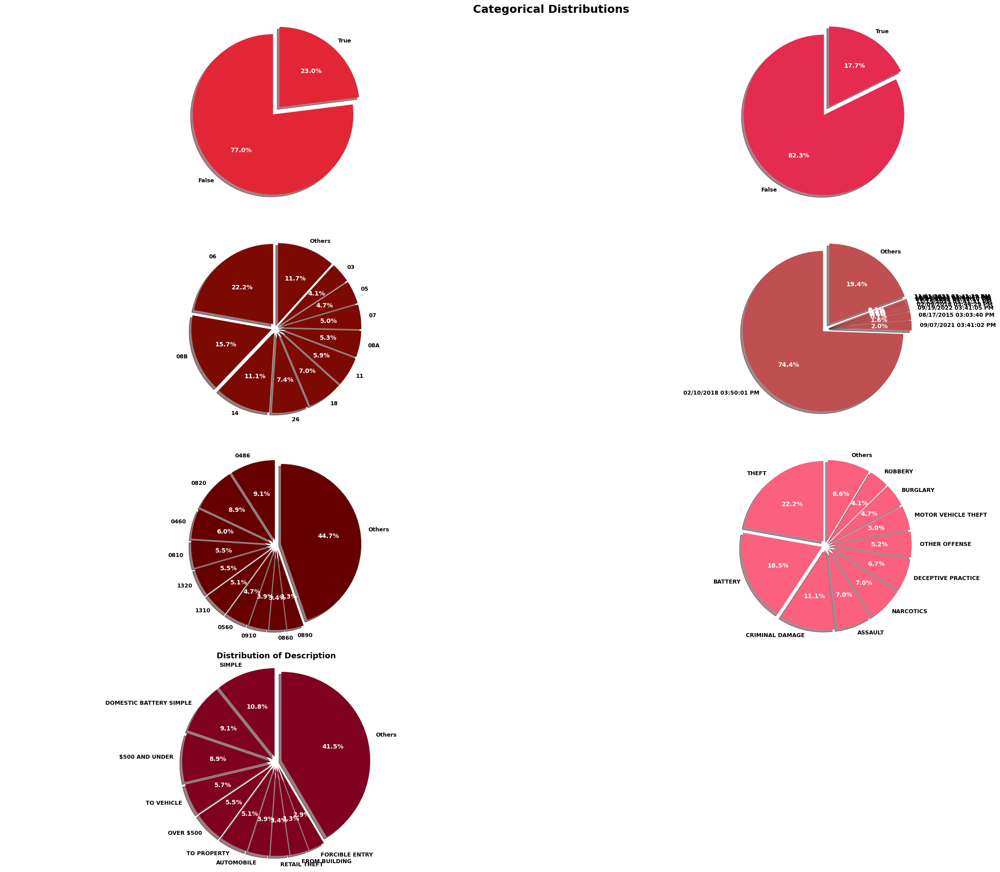

In [14]:
selected_cols = ['Arrest','Domestic','FBI Code','Updated On','IUCR','Primary Type','Description']

MAX_CATEGORIES = 10   
plt.figure(figsize=(25, 20))

subplot_idx = 1
color_idx = 0

for col in selected_cols:
    counts = df[col].value_counts(dropna=False) 

    if len(counts) <= 1:
        print(f"Skipping '{col}' (single unique value).")
        continue

    if len(counts) > MAX_CATEGORIES:
        top = counts[:MAX_CATEGORIES].copy()
        top['Others'] = counts[MAX_CATEGORIES:].sum()
        counts = top

    pie_color = [blood_hex[color_idx % len(blood_hex)]] * len(counts)
    color_idx += 1

    plt.subplot(4, 2, subplot_idx)
    subplot_idx += 1

    wedges, texts, autotexts = plt.pie(
        counts.values,
        labels=counts.index.astype(str),
        autopct='%1.1f%%',
        startangle=90,
        colors=pie_color,
        explode=[0.06] * len(counts),
        shadow=True,
        textprops={'fontsize': 9, 'fontweight': 'bold'}
    )

    for t in autotexts:
        t.set_color('white')
        t.set_fontsize(10)
        t.set_fontweight('bold')
plt.title(f"Distribution of {col}", fontsize=13, fontweight='bold')
plt.axis('equal')

plt.suptitle("Categorical Distributions", fontsize=18, fontweight='bold')
plt.tight_layout()
plt.show()


## Analyse des Tendances Annuelles de Criminalité
### Évolution du Nombre de Crimes (2001-2025)
Cette cellule calcule le nombre total de crimes par année sur une période de 25 ans.

In [15]:
#Total number of crimes (2001 to 2025)¶

df["Year"] = df["Year"].astype(int)

crime_per_year = df.groupby("Year")["Case Number"].count().reset_index()

crime_per_year.columns = ["Year", "Crime Count"]

crime_per_year

,Year,Crime Count
0,2015,255582
1,2016,150315
2,2017,2147
3,2018,1320
4,2019,1168
5,2020,1822
6,2021,2394
7,2022,4675
8,2023,81518
9,2024,814


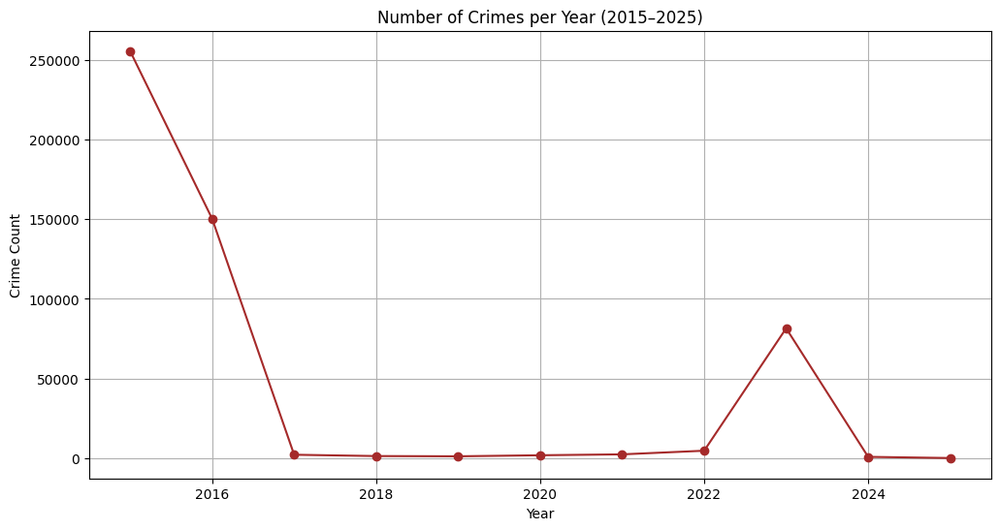

In [16]:
#The number of germs has decreased significantly so far
plt.figure(figsize=(12,6))
plt.plot(
    crime_per_year["Year"],
    crime_per_year["Crime Count"],
    marker="o",
    color="#A52A2A"  
)
plt.title("Number of Crimes per Year (2015–2025)")
plt.xlabel("Year")
plt.ylabel("Crime Count")
plt.grid(True)
plt.show()

In [17]:
#The most famous crimes¶
top_crimes = df["Primary Type"].value_counts().head(5)
print(top_crimes)

Primary Type
THEFT              111331
BATTERY             93010
CRIMINAL DAMAGE     55730
ASSAULT             35277
NARCOTICS           35065
Name: count, dtype: int64


### Évolution Temporelle des Différents Types de Crimes

In [18]:
type_year = (
    df.groupby(["Year", "Primary Type"])["Case Number"]
      .count()
      .reset_index()
      .sort_values(["Year", "Case Number"], ascending=[True, False])
)

type_year

,Year,Primary Type,Case Number
30,2015,THEFT,57267
2,2015,BATTERY,48879
6,2015,CRIMINAL DAMAGE,28659
18,2015,NARCOTICS,23331
1,2015,ASSAULT,17034
...,...,...,...
227,2024,CRIMINAL TRESPASS,4
230,2024,INTERFERENCE WITH PUBLIC OFFICER,1
235,2024,PUBLIC PEACE VIOLATION,1
238,2024,STALKING,1


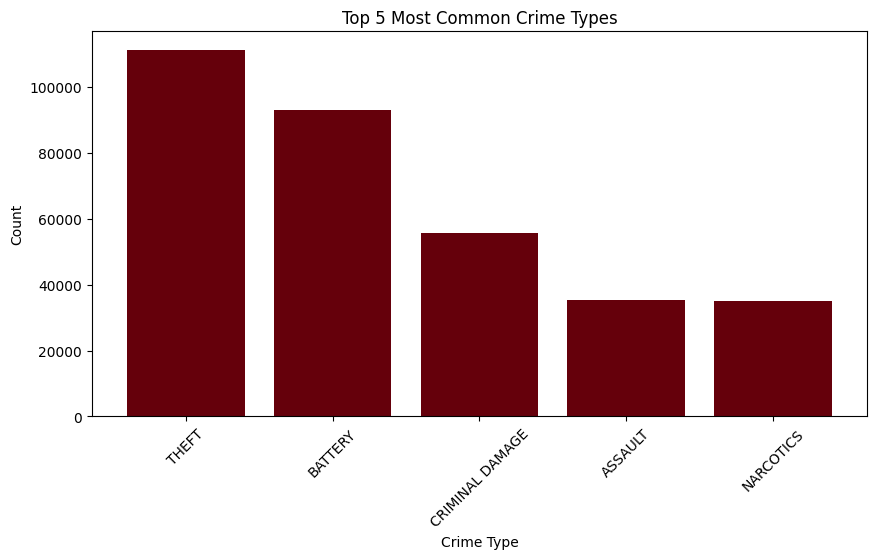

In [19]:
plt.figure(figsize=(10,5))
plt.bar(top_crimes.index, top_crimes.values,color='#65000B')
plt.title("Top 5 Most Common Crime Types")
plt.xlabel("Crime Type")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.show()

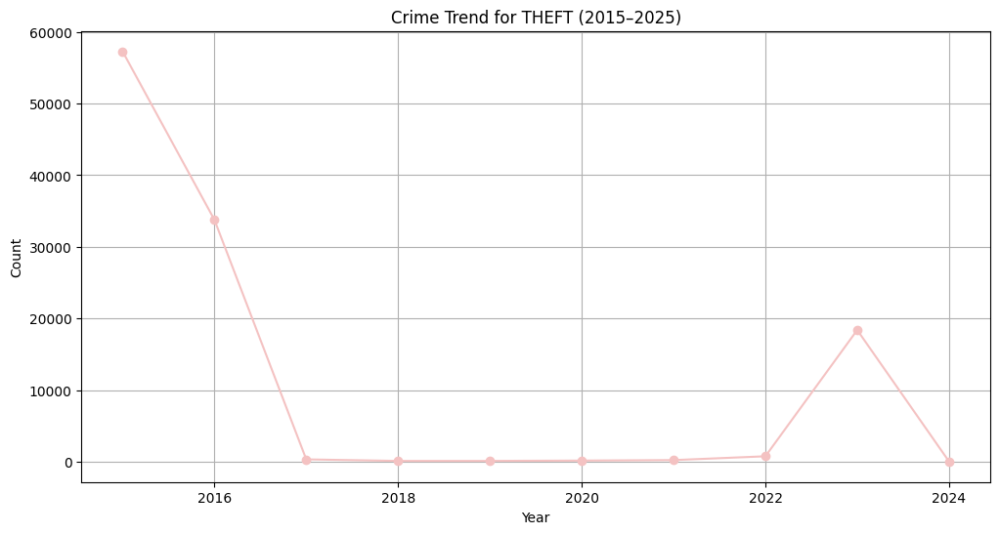

In [20]:
#After noticing that theft is the most common type of crime, we want to see whether it has decreased over the years or not¶
crime = "THEFT"  

subset = type_year[type_year["Primary Type"] == crime]

plt.figure(figsize=(12,6))
plt.plot(subset["Year"], subset["Case Number"], marker="o",color='#F4C2C2')
plt.title(f"Crime Trend for {crime} (2015–2025)")
plt.xlabel("Year")
plt.ylabel("Count")
plt.grid(True)
plt.show()

## Préparation des Données pour l'Analyse des Tendances par Type de Crime
### Nettoyage et Structuration des Données Temporelles
Cette cellule prépare les données pour une analyse approfondie des tendances criminelles par type de crime sur la période 2001-2024.

In [21]:
#Trend per Primary Type¶
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
df = df[(df['Year'] >= 2001) & (df['Year'] <= 2024)]

type_year = df.groupby(['Year', 'Primary Type'])['Case Number'].count().reset_index()
pivot = type_year.pivot(index='Year', columns='Primary Type', values='Case Number').fillna(0)

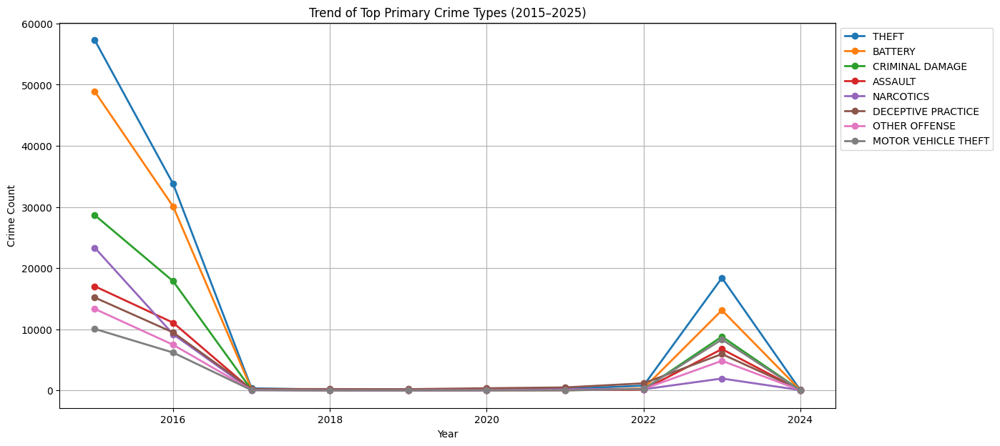

In [22]:
#From the graph above, we will know that the safest year was 2020 due to the absence of high rates of crimes.¶
N = 8
topN = df['Primary Type'].value_counts().head(N).index.tolist()
plt.figure(figsize=(14,7))
for crime in topN:
    plt.plot(pivot.index, pivot[crime], marker='o', label=crime, linewidth=2)
plt.title('Trend of Top Primary Crime Types (2015–2025)')
plt.xlabel('Year'); plt.ylabel('Crime Count')
plt.grid(True); plt.legend(loc='upper left', bbox_to_anchor=(1,1))
plt.gca().set_prop_cycle(None)
plt.show()

## Analyse Géographique des Crimes par Districts, Zones Communautaires et Wards
Top 15 des Zones les Plus Criminogènes
Cette cellule analyse la répartition spatiale des crimes selon trois découpages administratifs de Chicago.

In [23]:
#District – Community Area – Ward¶
district_counts = df['District'].value_counts(dropna=True).head(15)
community_counts = df['Community Area'].value_counts(dropna=True).head(15)
ward_counts = df['Ward'].value_counts(dropna=True).head(15)

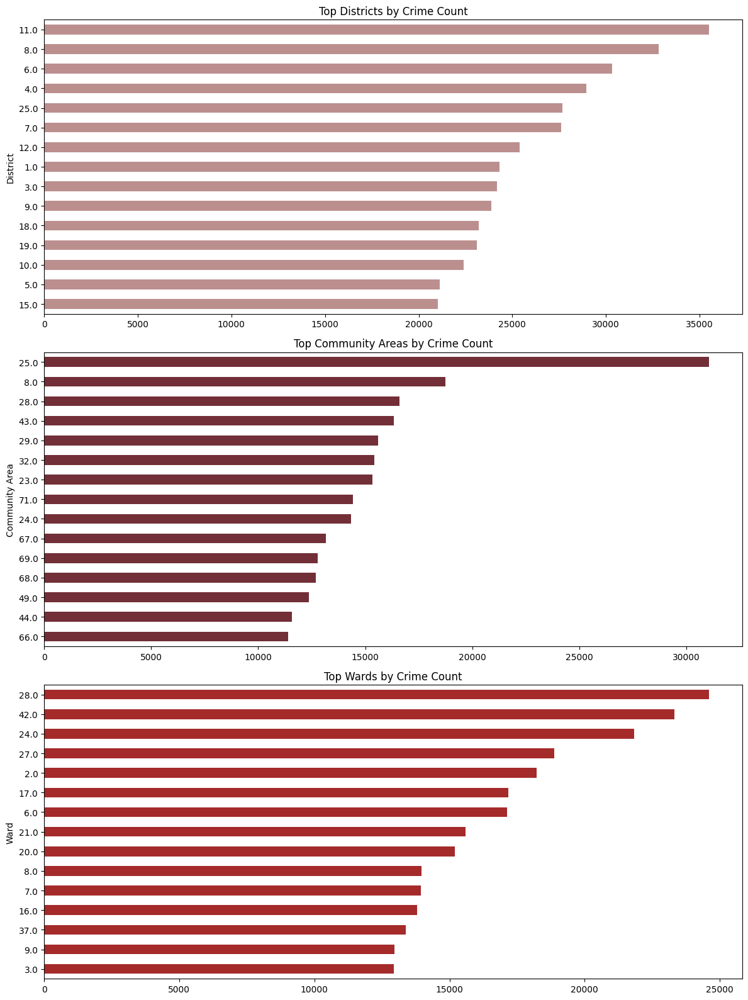

In [24]:
fig, axs = plt.subplots(3,1, figsize=(12,16))
district_counts.sort_values().plot(kind='barh', ax=axs[0], color='#BC8F8F'); axs[0].set_title('Top Districts by Crime Count')
community_counts.sort_values().plot(kind='barh', ax=axs[1], color='#722F37'); axs[1].set_title('Top Community Areas by Crime Count')
ward_counts.sort_values().plot(kind='barh', ax=axs[2], color='#A52A2A'); axs[2].set_title('Top Wards by Crime Count')
plt.tight_layout(); 
plt.show()

year_district = df.groupby(['Year','District'])['Case Number'].count().reset_index()

In [25]:
#Year x Month heatmap¶
df['Month'] = df['Date'].dt.month
df['Year'] = df['Date'].dt.year

## Heatmap des Crimes par Année et Mois (2001-2024)
### Visualisation des Patterns Saisonniers et Temporels
Cette cellule crée une carte de chaleur pour visualiser l'évolution mensuelle des crimes sur 24 ans.

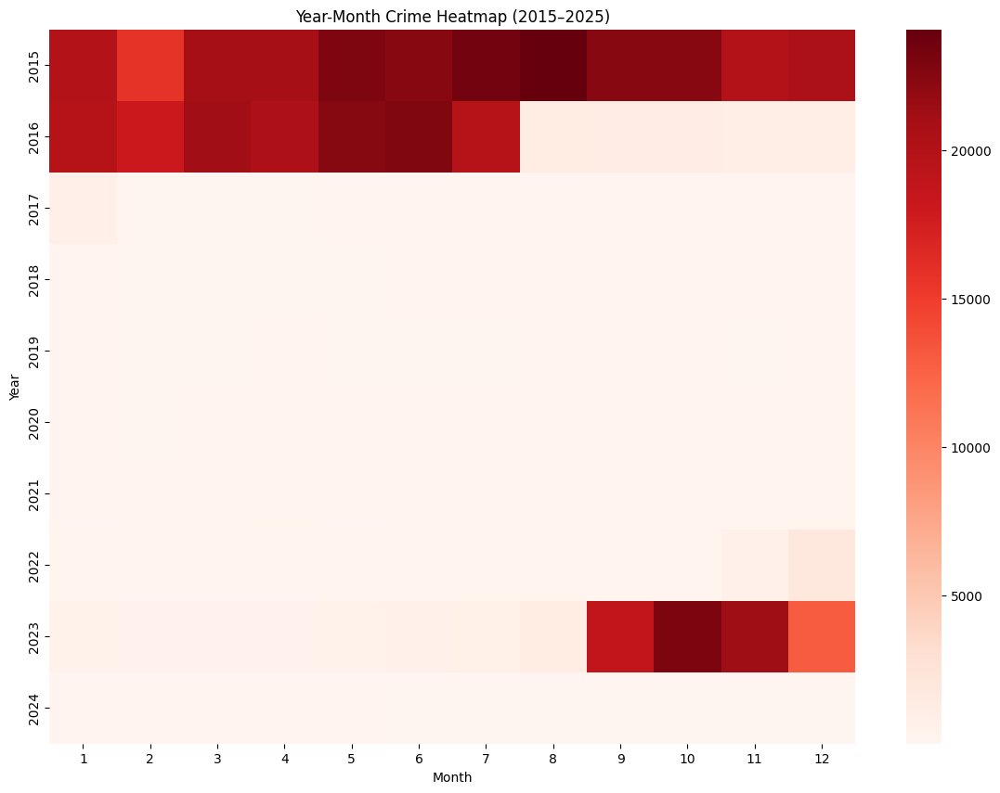

In [26]:
heat = df[(df['Year'] >= 2001) & (df['Year'] <= 2024)].groupby(['Year','Month'])['Case Number'].count().reset_index()
pivot_heat = heat.pivot(index='Year', columns='Month', values='Case Number').fillna(0)

plt.figure(figsize=(14,10))
sns.heatmap(pivot_heat, annot=False, fmt='g', cmap='Reds')
plt.title('Year-Month Crime Heatmap (2015–2025)')
plt.xlabel('Month'); plt.ylabel('Year')
plt.show()

In [27]:
#Most dangerous months across years¶
month_totals = df.groupby(df['Month'])['Case Number'].count().reindex(range(1,13), fill_value=0)
month_totals.index = month_totals.index.map(lambda m: pd.Timestamp(2000, m, 1).strftime('%b'))  # Jan, Feb, ...

In [28]:
top_combos = df.groupby(['Year','Month'])['Case Number'].count().reset_index().sort_values('Case Number', ascending=False).head(20)

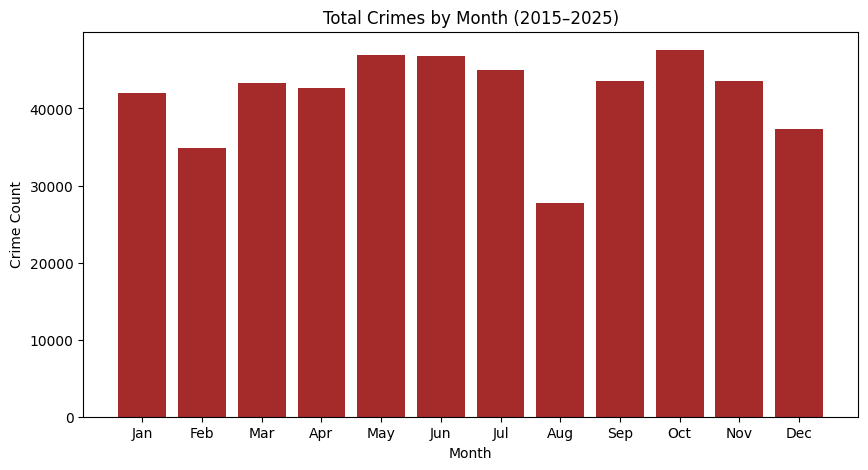

Top Year-Month combinations:
      Year  Month  Case Number
7    2015      8        24063
6    2015      7        23462
105  2023     10        22969
4    2015      5        22886
17   2016      6        22795
16   2016      5        22556
8    2015      9        22440
9    2015     10        22430
5    2015      6        22372
106  2023     11        21266
14   2016      3        21186
3    2015      4        20952
2    2015      3        20875
11   2015     12        20476
15   2016      4        20324
0    2015      1        19976
10   2015     11        19943
18   2016      7        19727
12   2016      1        19719
104  2023      9        18956


In [29]:
plt.figure(figsize=(10,5))
plt.bar(month_totals.index, month_totals.values, color='#A52A2A')
plt.title('Total Crimes by Month (2015–2025)')
plt.xlabel('Month'); plt.ylabel('Crime Count'); plt.show()

print("Top Year-Month combinations:\n", top_combos)

## Analyse Temporelle Granulaire et Nettoyage Géospatial
### Préparation des Variables Temporelles et Filtrage des Données Spatiales
Cette cellule effectue plusieurs opérations cruciales pour l'analyse spatio-temporelle avancée des crimes.

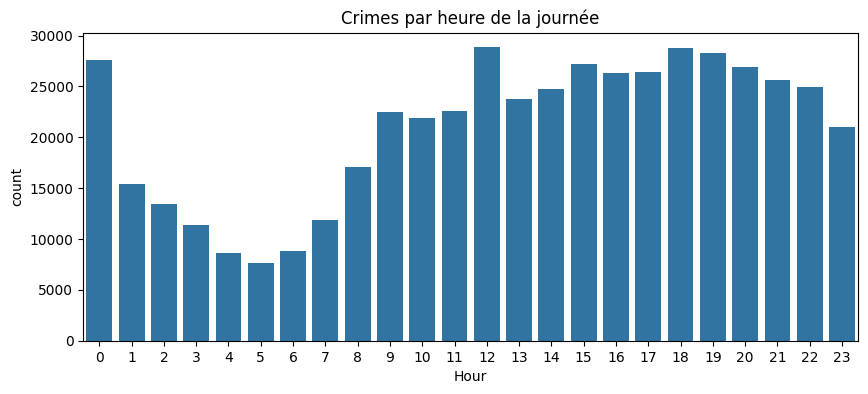

In [30]:
import plotly.express as px
# Convertir Date → datetime
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

# Supprimer dates invalides
df = df.dropna(subset=['Date'])

# Extraire les features temporelles
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day
df['Hour'] = df['Date'].dt.hour
df['DayOfWeek'] = df['Date'].dt.dayofweek  # 0 = lundi

plt.figure(figsize=(10,4))
sns.countplot(data=df, x='Hour')
plt.title("Crimes par heure de la journée")
plt.show()
# Supprimer coordonnées manquantes
df = df.dropna(subset=['Latitude', 'Longitude'])


## Analyse des Corrélations entre Variables
### Heatmap des Relations Linéaires entre Variables Numériques
Cette cellule analyse les corrélations linéaires entre les principales variables numériques du dataset criminel.

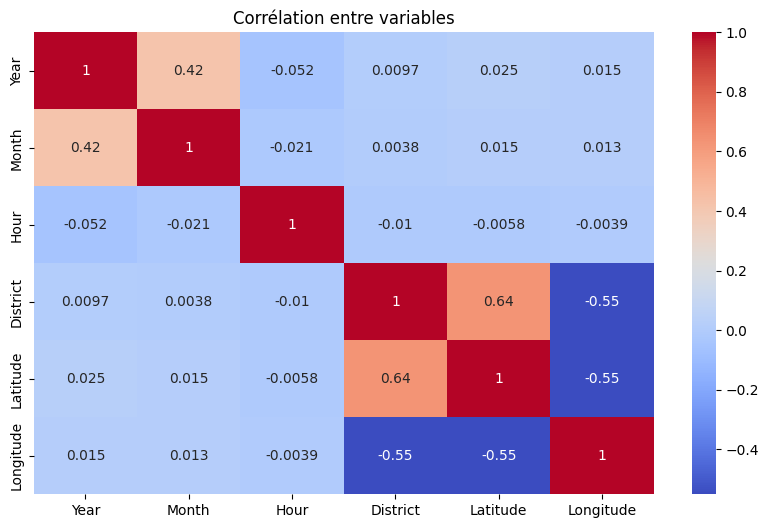

In [31]:
#Heatmap des corrélations
plt.figure(figsize=(10,6))
sns.heatmap(df[['Year','Month','Hour','District','Latitude','Longitude']].corr(),
            annot=True, cmap='coolwarm')
plt.title("Corrélation entre variables")
plt.show()


## Distribution des Variables Numériques Clés
### Analyse des Distributions via Histogrammes
Cette cellule visualise les distributions de quatre variables numériques essentielles pour comprendre la structure des données criminelles.

## Variables Analysées
Latitude : Position nord-sud (≈ 41.6°N à 42.0°N pour Chicago)

Longitude : Position est-ouest (≈ -87.9°W à -87.5°W pour Chicago)

Hour : Heure du crime (0-23)

Month : Mois du crime (1-12)

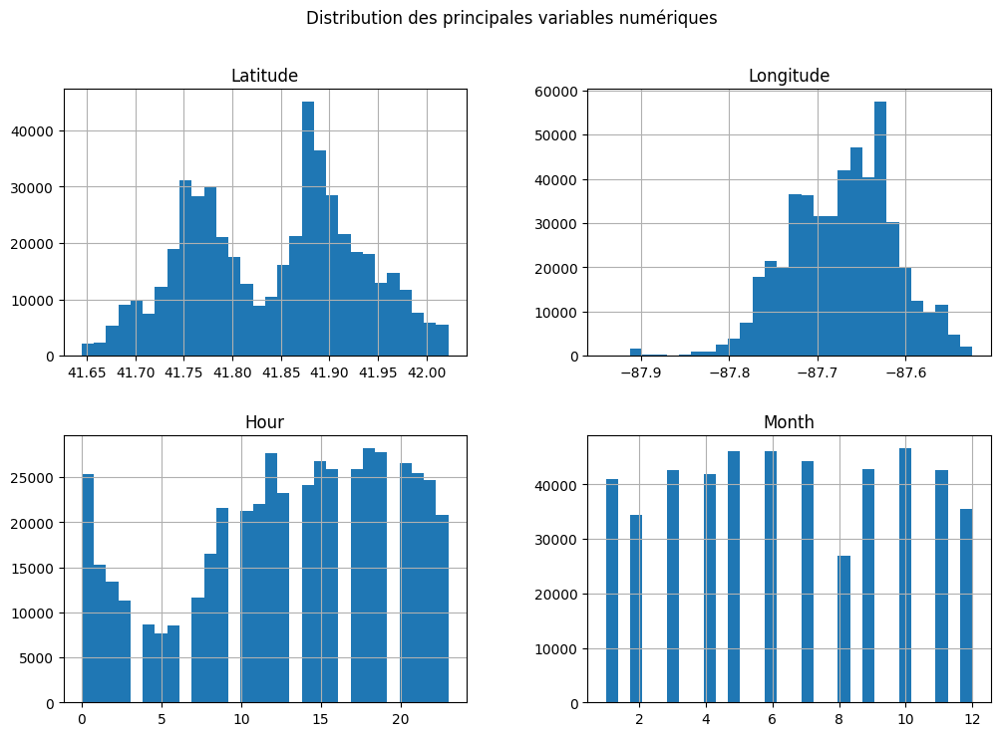

In [32]:
df[['Latitude','Longitude','Hour','Month']].hist(figsize=(12,8), bins=30)
plt.suptitle("Distribution des principales variables numériques")
plt.show()

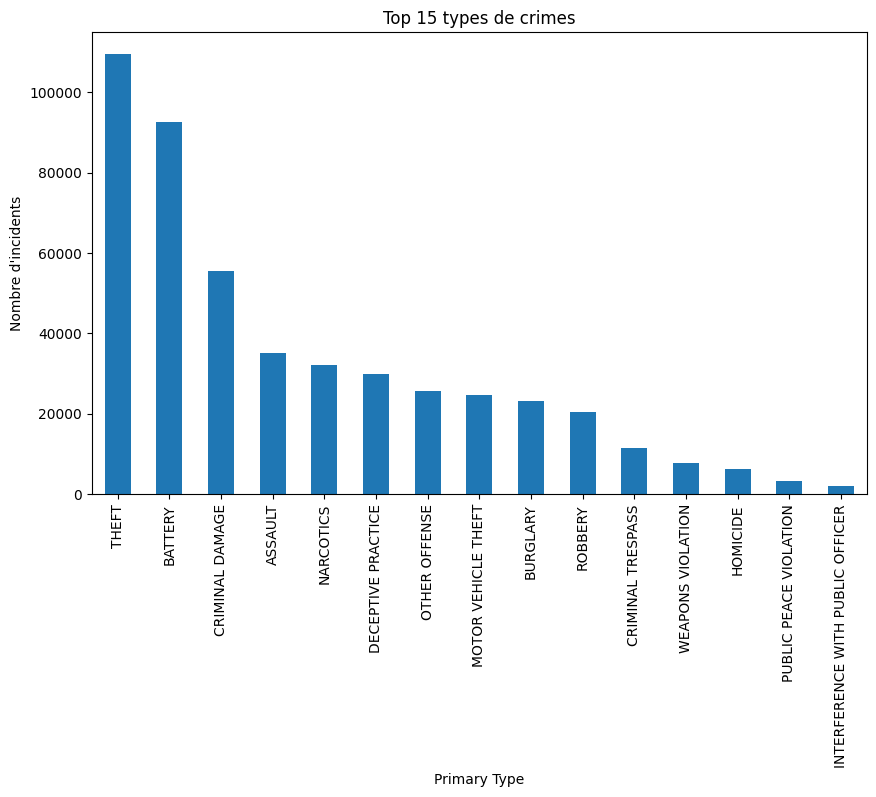

In [33]:
plt.figure(figsize=(10,6))
df['Primary Type'].value_counts().head(15).plot(kind='bar')
plt.title("Top 15 types de crimes")
plt.ylabel("Nombre d'incidents")
plt.show()

## Carte Interactive des Crimes à Chicago
### Visualisation Géospatiale Interactive avec Plotly
Cette cellule crée une carte interactive pour explorer la distribution spatiale des crimes à Chicago, colorée par type de crime.

In [34]:
#Carte interactive (Plotly)
fig = px.scatter_mapbox(
    df.sample(10000, random_state=1),   # échantillon pour performance
    lat="Latitude",
    lon="Longitude",
    color="Primary Type",
    zoom=10,
    height=600
)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(title="Carte interactive des crimes à Chicago")
fig.show()

C:\Users\DELL\AppData\Local\Temp\ipykernel_6220\3552894942.py:2: DeprecationWarning: *scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/
  fig = px.scatter_mapbox(


## Heatmap Spatiale de Densité des Crimes

### Visualisation de la Concentration Géographique des Crimes
Cette cellule crée une carte de densité (heatmap) pour visualiser les zones de concentration criminelle à Chicago.

In [35]:
#Heatmap spatiale (densité)

# Échantillon pour performance
df_sample = df.sample(20000, random_state=1)

fig = px.density_map(
    df_sample,
    lat="Latitude",
    lon="Longitude",
    z=None,                # optionnel, pour pondérer les points
    radius=10,             # rayon des points en pixels
    center=dict(lat=41.8781, lon=-87.6298),
    zoom=10,
    map_style="open-street-map"  # <--- corrigé
)

fig.update_layout(title="Heatmap de densité des crimes (Plotly v6+)")
fig.show()

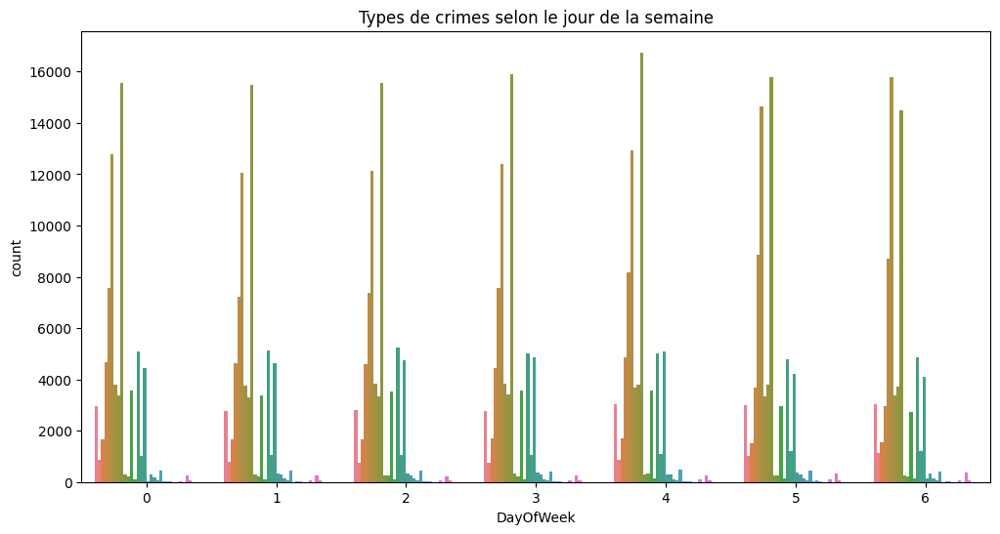

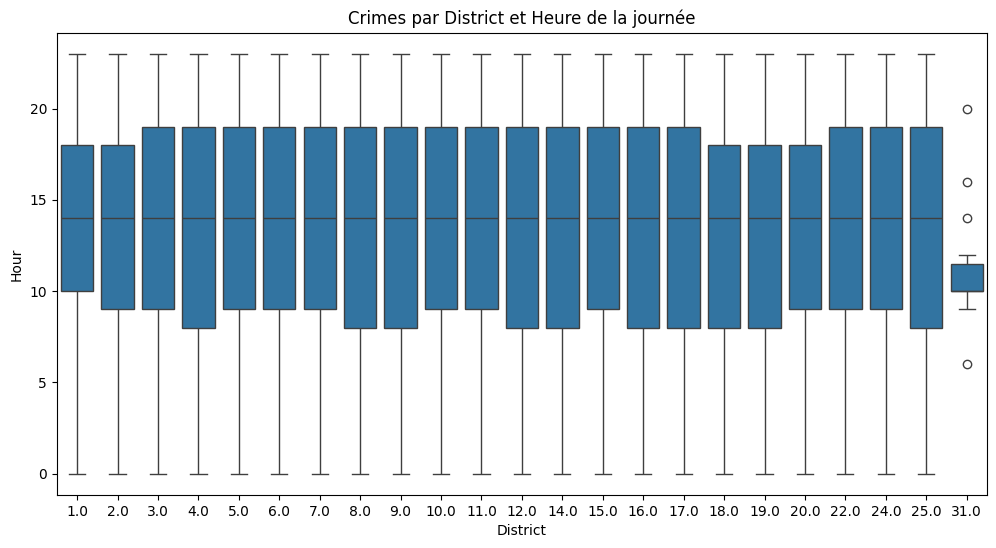

In [36]:
#Crimes par jour de la semaine vs type de crime
plt.figure(figsize=(12,6))
sns.countplot(data=df, x='DayOfWeek', hue='Primary Type', order=[0,1,2,3,4,5,6])
plt.title("Types de crimes selon le jour de la semaine")
plt.legend([],[], frameon=False)
plt.show()
#Crimes selon District
plt.figure(figsize=(12,6))
sns.boxplot(data=df, x='District', y='Hour')
plt.title("Crimes par District et Heure de la journée")
plt.show()


### Importation des Outils de Prétraitement et Feature Engineering
## Préparation pour la Modélisation Prédictive
Cette cellule importe les bibliothèques essentielles pour transformer les données brutes en features adaptées aux algorithmes de machine learning.

In [37]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_selection import mutual_info_classif, SelectKBest
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

In [38]:
# Supprimer les lignes sans coordonnées
df = df.dropna(subset=['Latitude', 'Longitude'])

# Convertir Date en datetime
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
# Extraire features temporelles
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day
df['Hour'] = df['Date'].dt.hour
df['DayOfWeek'] = df['Date'].dt.dayofweek

In [39]:
# Encodage des variables catégorielles
# LabelEncoder (pour Primary Type)
le = LabelEncoder()
df['PrimaryType_Label'] = le.fit_transform(df['Primary Type'])

In [40]:
# Normalisation / Standardisation
num_features = ['Latitude', 'Longitude', 'Hour', 'Month', 'DayOfWeek']
scaler = StandardScaler()
df[num_features] = scaler.fit_transform(df[num_features])

In [41]:
#Extraction de features ( PCA pour réduire la dimension)
pca = PCA(n_components=3)  # choisir n_components selon besoin
pca_features = pca.fit_transform(df[num_features])
df[['PCA1','PCA2','PCA3']] = pca_features

In [42]:
#Création de nouvelles variables pertinentes

# Crime la nuit ou jour
df['IsNight'] = df['Hour'].apply(lambda x: 1 if x>=20 or x<=5 else 0)

# Weekend ou semaine
df['IsWeekend'] = df['DayOfWeek'].apply(lambda x: 1 if x>=5 else 0)

# Interaction features
df['Lat_Long'] = df['Latitude'] * df['Longitude']

In [43]:
#Sélection de features (ARREST)
from sklearn.feature_selection import SelectKBest, mutual_info_classif

# Cible
target = df['Arrest'].astype(int)

# Colonnes numériques et encodées
numeric_cols = [
    'Latitude', 'Longitude', 'Hour', 'Month', 'DayOfWeek',
    'PrimaryType_Label'
] + list(df.filter(like='District_').columns)  # toutes les colonnes OHE

X = df[numeric_cols]

# Sélection des 20 meilleures features
selector = SelectKBest(score_func=mutual_info_classif, k=min(20, X.shape[1]))
X_selected = selector.fit_transform(X, target)

selected_cols = X.columns[selector.get_support()]
print("Features sélectionnées :", list(selected_cols))


Features sélectionnées : ['Latitude', 'Longitude', 'Hour', 'Month', 'DayOfWeek', 'PrimaryType_Label']


In [44]:
# ACP 
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import folium
import plotly.express as px

print("=== ANALYSE EN COMPOSANTES PRINCIPALES (ACP) ===")

if 'daily' not in globals():
    df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
    df = df.dropna(subset=['Latitude', 'Longitude', 'Date']).copy()
    df['lat_cell'] = df['Latitude'].round(3)
    df['lon_cell'] = df['Longitude'].round(3)
    df['day'] = df['Date'].dt.date
    daily = df.groupby(['lat_cell', 'lon_cell', 'day']).size().reset_index(name='crime_count')
    daily['day'] = pd.to_datetime(daily['day'])

# --- 1. Statistiques par cellule ---
spatial_stats = daily.groupby(['lat_cell', 'lon_cell']).agg(
    total_crimes=('crime_count', 'sum'),
    avg_daily=('crime_count', 'mean'),
    std_daily=('crime_count', 'std'),
    max_daily=('crime_count', 'max'),
    days_with_crime=('crime_count', lambda x: (x > 0).sum()),
    perc_days_active=('crime_count', lambda x: (x > 0).mean())
).fillna(0).reset_index()

coords = df.groupby(['lat_cell', 'lon_cell'])[['Latitude', 'Longitude']].mean().reset_index()
spatial_stats = spatial_stats.merge(coords, on=['lat_cell', 'lon_cell'], how='left')

print(f"Nombre de cellules analysées : {len(spatial_stats):,}")


=== ANALYSE EN COMPOSANTES PRINCIPALES (ACP) ===
Nombre de cellules analysées : 143,737



RÈGLE DE KAISER (valeurs propres > 1) :
   → 2 composante(s) ont une valeur propre > 1 → à retenir selon Kaiser


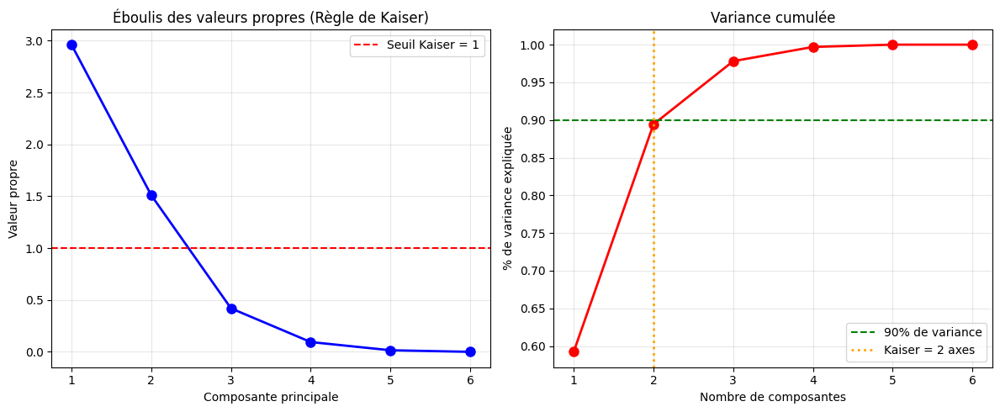

In [45]:
# ---  ACP ---
features_acp = ['total_crimes', 'avg_daily', 'std_daily', 'max_daily', 'days_with_crime', 'perc_days_active']
X_acp = spatial_stats[features_acp]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_acp)

pca = PCA()
X_pca_full = pca.fit_transform(X_scaled)
var_exp = pca.explained_variance_ratio_
cum_var = np.cumsum(var_exp)
eigenvalues = pca.explained_variance_  # Valeurs propres

# ---  NOUVELLE PARTIE : RÈGLE DE KAISER + ÉBOULIS ---
print(f"\nRÈGLE DE KAISER (valeurs propres > 1) :")
n_components_kaiser = np.sum(eigenvalues > 1)
print(f"   → {n_components_kaiser} composante(s) ont une valeur propre > 1 → à retenir selon Kaiser")

plt.figure(figsize=(12, 5))

# Éboulis des valeurs propres
plt.subplot(1, 2, 1)
plt.plot(range(1, len(eigenvalues)+1), eigenvalues, 'bo-', linewidth=2, markersize=8)
plt.axhline(y=1, color='r', linestyle='--', label='Seuil Kaiser = 1')
plt.title('Éboulis des valeurs propres (Règle de Kaiser)')
plt.xlabel('Composante principale')
plt.ylabel('Valeur propre')
plt.legend()
plt.grid(alpha=0.3)

# Variance expliquée cumulée
plt.subplot(1, 2, 2)
plt.plot(range(1, len(var_exp)+1), cum_var, 'ro-', linewidth=2, markersize=8)
plt.axhline(y=0.90, color='green', linestyle='--', label='90% de variance')
plt.axvline(x=n_components_kaiser, color='orange', linestyle=':', linewidth=2, label=f'Kaiser = {n_components_kaiser} axes')
plt.title('Variance cumulée')
plt.xlabel('Nombre de composantes')
plt.ylabel('% de variance expliquée')
plt.legend()
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [46]:
# --- Variance ---
print(f"\nVariance par composante :")
for i in range(min(6, len(var_exp))):
    print(f"   PC{i+1} : {var_exp[i]:.2%} → cumulée : {cum_var[i]:.2%}")


Variance par composante :
   PC1 : 59.23% → cumulée : 59.23%
   PC2 : 30.20% → cumulée : 89.43%
   PC3 : 8.38% → cumulée : 97.81%
   PC4 : 1.89% → cumulée : 99.70%
   PC5 : 0.30% → cumulée : 100.00%
   PC6 : 0.00% → cumulée : 100.00%


In [47]:
# ---  Interprétation  ---
corr_pc1 = pd.Series({f: abs(np.corrcoef(X_scaled[:, i], X_pca_full[:, 0])[0,1]) 
                     for i, f in enumerate(features_acp)}).sort_values(ascending=False)
corr_pc2 = pd.Series({f: abs(np.corrcoef(X_scaled[:, i], X_pca_full[:, 1])[0,1]) 
                     for i, f in enumerate(features_acp)}).sort_values(ascending=False)

print(f"\nInterprétation des axes principaux :")
print(f"   PCA1 ({var_exp[0]:.1%}) → dominé par → {corr_pc1.index[0]}, {corr_pc1.index[1]}")
print(f"   PCA2 ({var_exp[1]:.1%}) → dominé par → {corr_pc2.index[0]}")


Interprétation des axes principaux :
   PCA1 (59.2%) → dominé par → max_daily, std_daily
   PCA2 (30.2%) → dominé par → days_with_crime


c:\Users\DELL\Desktop\projet -Machine Learning\.venv\Lib\site-packages\numpy\lib\_function_base_impl.py:3065: RuntimeWarning:

invalid value encountered in divide

c:\Users\DELL\Desktop\projet -Machine Learning\.venv\Lib\site-packages\numpy\lib\_function_base_impl.py:3066: RuntimeWarning:

invalid value encountered in divide



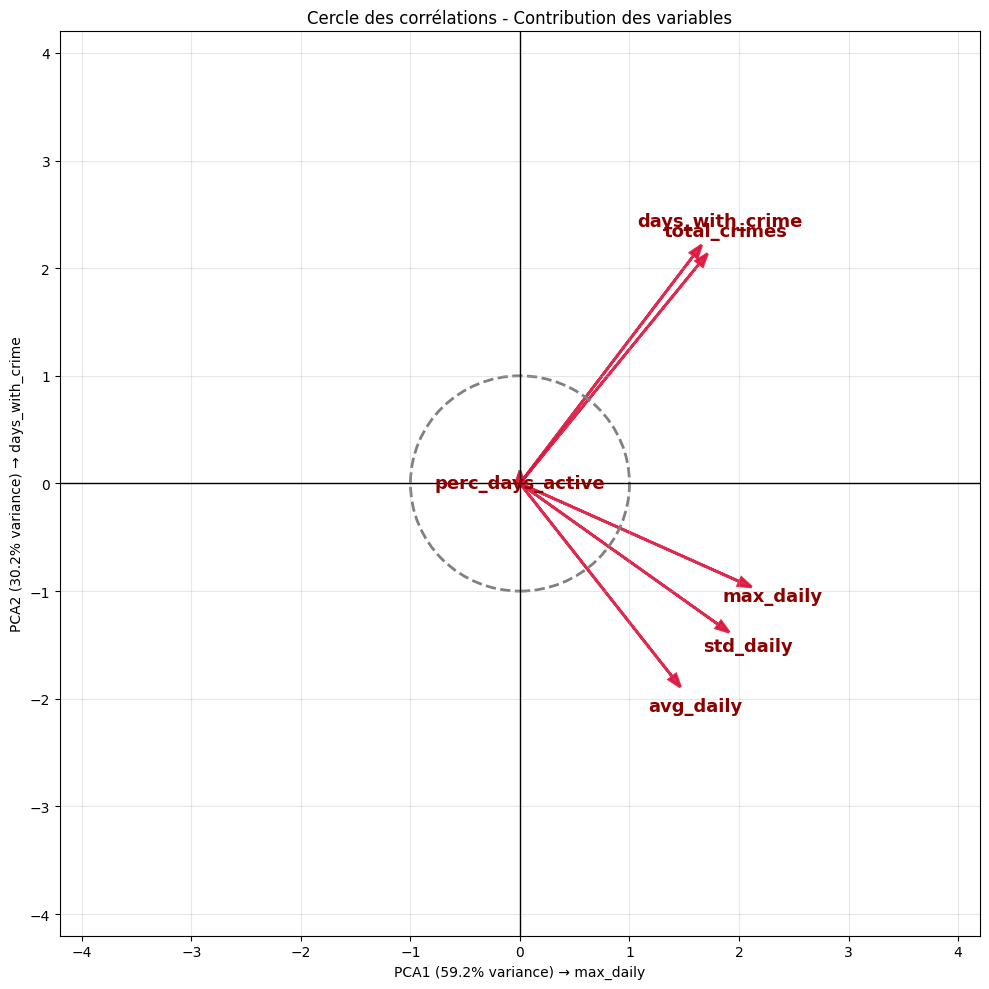

In [48]:
# ---  CERCLE DES CORRÉLATIONS ---
plt.figure(figsize=(10,10))
for i, feat in enumerate(features_acp):
    x = pca.components_[0, i] * 3.8
    y = pca.components_[1, i] * 3.8
    plt.arrow(0, 0, x, y, head_width=0.08, color='crimson', alpha=0.9, linewidth=2)
    plt.text(x*1.15, y*1.15, feat, fontsize=13, fontweight='bold', color='darkred',
             ha='center', va='center')

circle = plt.Circle((0,0), 1, color='gray', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle)
plt.xlim(-4.2, 4.2); plt.ylim(-4.2, 4.2)
plt.axhline(0, color='black', linewidth=1)
plt.axvline(0, color='black', linewidth=1)
plt.xlabel(f'PCA1 ({var_exp[0]:.1%} variance) → {corr_pc1.index[0]}')
plt.ylabel(f'PCA2 ({var_exp[1]:.1%} variance) → {corr_pc2.index[0]}')
plt.title('Cercle des corrélations - Contribution des variables')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


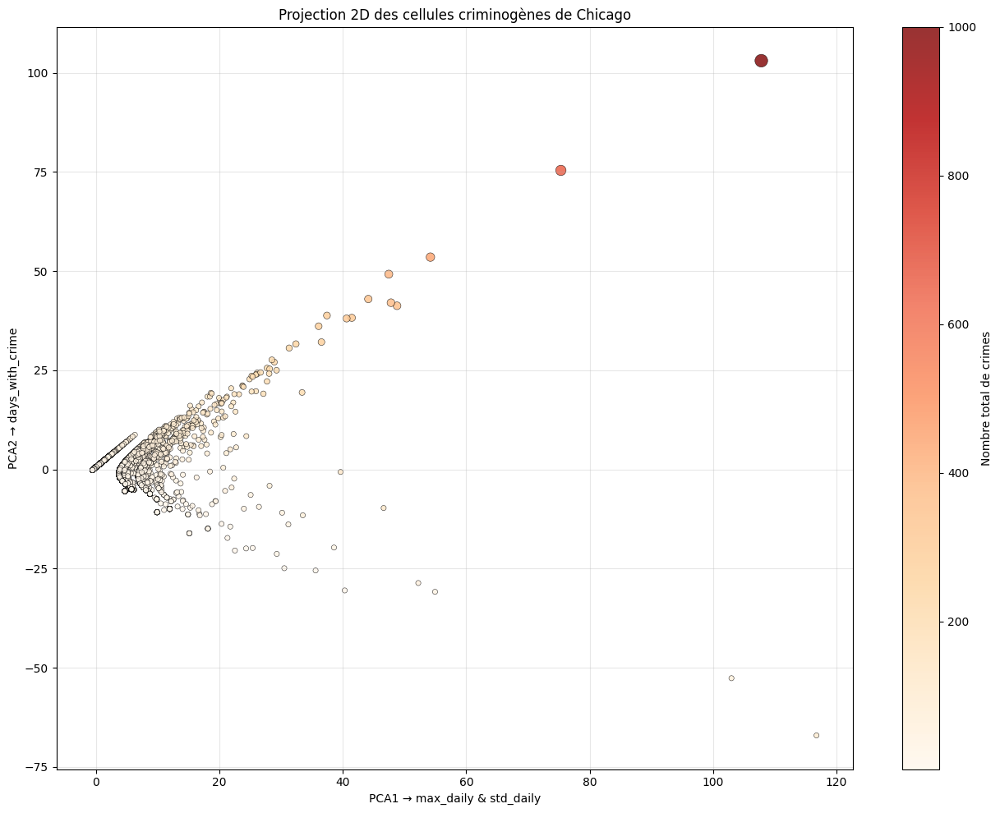

In [49]:
# ---  Projection 2D ---
df_pca_2d = pd.DataFrame({
    'PCA1': X_pca_full[:,0], 'PCA2': X_pca_full[:,1],
    'total_crimes': spatial_stats['total_crimes'],
    'Latitude': spatial_stats['Latitude'], 'Longitude': spatial_stats['Longitude']
})

plt.figure(figsize=(13,10))
scatter = plt.scatter(df_pca_2d['PCA1'], df_pca_2d['PCA2'],
                     c=df_pca_2d['total_crimes'], cmap='OrRd', alpha=0.8,
                     s=np.clip(df_pca_2d['total_crimes']/8, 20, 600),
                     edgecolors='black', linewidth=0.4)
plt.colorbar(scatter, label='Nombre total de crimes')
plt.title('Projection 2D des cellules criminogènes de Chicago')
plt.xlabel(f'PCA1 → {corr_pc1.index[0]} & {corr_pc1.index[1]}')
plt.ylabel(f'PCA2 → {corr_pc2.index[0]}')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [50]:
# ---  Projection 3D interactive ---
df_pca_3d = pd.DataFrame({
    'PCA1': X_pca_full[:,0], 'PCA2': X_pca_full[:,1], 'PCA3': X_pca_full[:,2],
    'total_crimes': spatial_stats['total_crimes'],
    'Latitude': spatial_stats['Latitude'], 'Longitude': spatial_stats['Longitude']
})

fig = px.scatter_3d(df_pca_3d, x='PCA1', y='PCA2', z='PCA3',
                    color='total_crimes', size=np.clip(df_pca_3d['total_crimes']/20, 3, 30),
                    color_continuous_scale='Reds', hover_data=['Latitude', 'Longitude'],
                    title='Projection 3D interactive des hotspots (PCA1 × PCA2 × PCA3)')
fig.update_layout(scene=dict(
    xaxis_title=f'PCA1 ({var_exp[0]:.1%})',
    yaxis_title=f'PCA2 ({var_exp[1]:.1%})',
    zaxis_title=f'PCA3 ({var_exp[2]:.1%})'
))
fig.show()
fig.write_html("projection_3D_hotspots_Chicago.html")

In [51]:
# ---  Carte Folium ---
m = folium.Map(location=[41.8781, -87.6298], zoom_start=11, tiles="CartoDB positron")
for _, r in df_pca_2d.iterrows():
    color = 'darkred' if r['PCA1'] > df_pca_2d['PCA1'].quantile(0.95) else \
            'red' if r['PCA1'] > df_pca_2d['PCA1'].quantile(0.80) else 'lightgray'
    radius = 7 if color == 'darkred' else 5 if color == 'red' else 3
    folium.CircleMarker([r['Latitude'], r['Longitude']], radius=radius, color=color,
                        fill=True, fillOpacity=0.8,
                        popup=f"PCA1: {r['PCA1']:.2f}<br>Crimes: {int(r['total_crimes'])}").add_to(m)
m.save("hotspots_Chicago_ACP_carte.html")

print("   • Règle de Kaiser ")
print("   • Cercle des corrélations")
print("   • Projections 2D & 3D interactive")
print("   • Carte des hotspots")

   • Règle de Kaiser 
   • Cercle des corrélations
   • Projections 2D & 3D interactive
   • Carte des hotspots


In [52]:
from sklearn.preprocessing import StandardScaler
# objectif ==> identifier automatiquement des zones qui deviennent plus dangereuses ou atypiques.

# Colonnes utiles pour clustering
cluster_features = [
    'Latitude', 'Longitude', 'Hour', 'DayOfWeek', 'Month',
    'PrimaryType_Label'
] + list(df.filter(like='District_').columns)  # Colonnes OneHot pour District

X_cluster = df[cluster_features]

# Normalisation
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_cluster)


## CLUSTERING NON SUPERVISÉ DES CRIMES 
### 1/ KMeans
 trouver des hotspots de criminalité à partir de la latitude/longitude

In [53]:
# CLUSTERING NON SUPERVISÉ DES CRIMES (KMEANS)

# 1. Garder uniquement les lignes avec coordonnées valides
df_cluster = df[['Latitude', 'Longitude']].dropna().copy()

print("Nombre de crimes avec coordonnées valides :", len(df_cluster))

# (Optionnel) échantillonnage pour aller plus vite si le dataset est très grand
df_sample = df_cluster.sample(n=50000, random_state=42)  # tu peux ajuster n

# 2. Standardiser les coordonnées (important pour KMeans/DBSCAN)
scaler_clust = StandardScaler()
X_clust = scaler_clust.fit_transform(df_sample[['Latitude', 'Longitude']])


Nombre de crimes avec coordonnées valides : 490605


In [54]:
#  Choisir le nombre de clusters (K)
# On teste plusieurs K et on regarde le score de silhouette
scores = {}
for k in [3, 5, 7, 10]:
    kmeans_temp = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels_temp = kmeans_temp.fit_predict(X_clust)
    score = silhouette_score(X_clust, labels_temp)
    scores[k] = score
    print(f"K = {k} → Silhouette = {score:.3f}")

# Choisir un K raisonnable (par exemple celui avec le meilleur score)
k_opt = max(scores, key=scores.get)
print(f"\n✅ Nombre de clusters choisi (K) :", k_opt)

#  Entraîner KMeans avec le K choisi
kmeans = KMeans(n_clusters=k_opt, random_state=42, n_init=10)
cluster_labels = kmeans.fit_predict(X_clust)

# Ajouter les labels de cluster au DataFrame échantillonné
df_sample = df_sample.copy()
df_sample['Cluster_KMeans'] = cluster_labels


NameError: name 'silhouette_score' is not defined

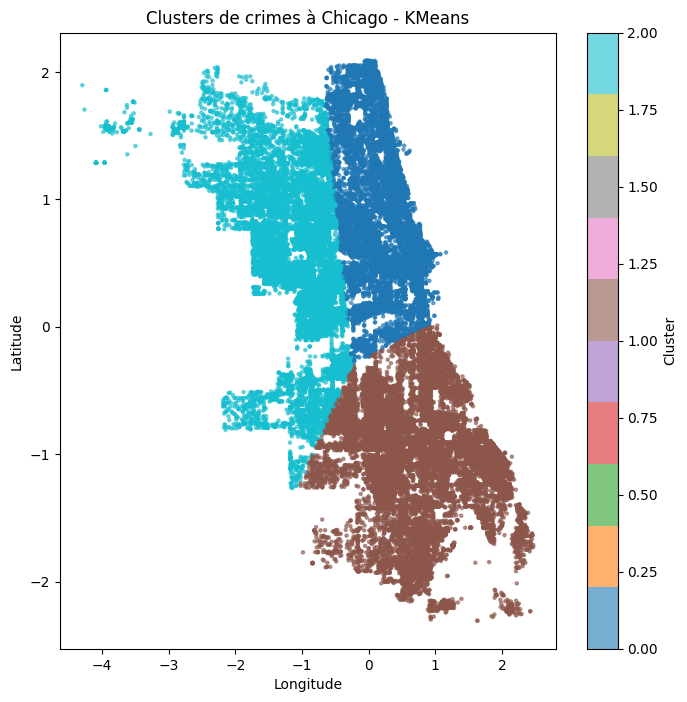

In [ ]:
plt.figure(figsize=(8, 8))
scatter = plt.scatter(
    df_sample['Longitude'], 
    df_sample['Latitude'],
    c=df_sample['Cluster_KMeans'],
    cmap='tab10',
    s=5,
    alpha=0.6
)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Clusters de crimes à Chicago - KMeans")
plt.colorbar(scatter, label="Cluster")
plt.show()

## 2/DBSCAN
### détecter automatiquement des « denses zones » 
DBSCAN ne demande pas de choisir un nombre de clusters à l’avance et trouve des groupes de points denses, en marquant les points isolés comme bruit (label = -1).


DBSCAN a trouvé 9 clusters (hors bruit).


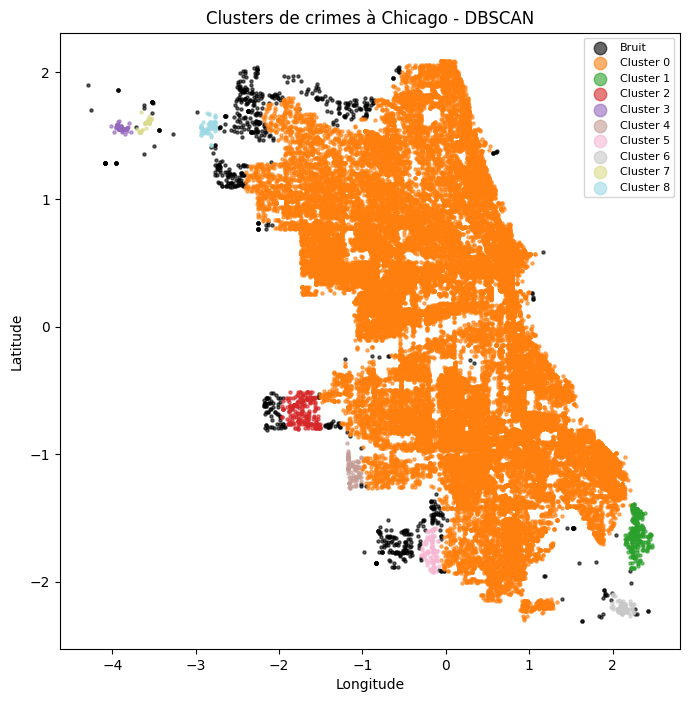

In [ ]:
# CLUSTERING AVEC DBSCAN 


dbscan = DBSCAN(
    eps=0.1,        # distance max (en unités standardisées)
    min_samples=50  # nombre minimum de points pour former un cluster
)

labels_db = dbscan.fit_predict(X_clust)
df_sample['Cluster_DBSCAN'] = labels_db

# Nombre de clusters trouvés (hors bruit -1)
n_clusters_db = len(set(labels_db)) - (1 if -1 in labels_db else 0)
print(f"\nDBSCAN a trouvé {n_clusters_db} clusters (hors bruit).")

# Visualisation
plt.figure(figsize=(8, 8))
unique_labels = sorted(set(labels_db))
colors = plt.cm.tab20(np.linspace(0, 1, len(unique_labels)))

for label, color in zip(unique_labels, colors):
    mask = (labels_db == label)
    if label == -1:
        # Bruit
        col = 'k'
        lab = 'Bruit'
    else:
        col = color
        lab = f'Cluster {label}'
    plt.scatter(
        df_sample.loc[mask, 'Longitude'],
        df_sample.loc[mask, 'Latitude'],
        c=[col],
        s=5,
        alpha=0.6,
        label=lab
    )

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Clusters de crimes à Chicago - DBSCAN")
plt.legend(markerscale=4, fontsize=8)
plt.show()

Taille train : (404586, 6)
Taille val   : (4799, 6)
Taille test  : (81220, 6)


c:\Users\DELL\Desktop\projet -Machine Learning\.venv\Lib\site-packages\xgboost\training.py:199: UserWarning:

[21:51:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.





==== Logistic Regression ====
Accuracy : 0.5634165978740535
Precision: 0.2796456352636128
Recall   : 0.5766865698244363
F1-score : 0.37664794388987516
AUC-ROC  : 0.5916879318393817


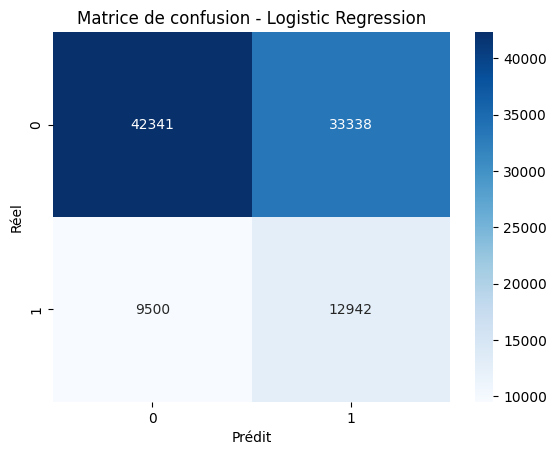


==== RandomForest ====
Accuracy : 0.8651257121309404
Precision: 0.8491052471944192
Recall   : 0.49897513590589077
F1-score : 0.6285714285714286
AUC-ROC  : 0.8482440233958349


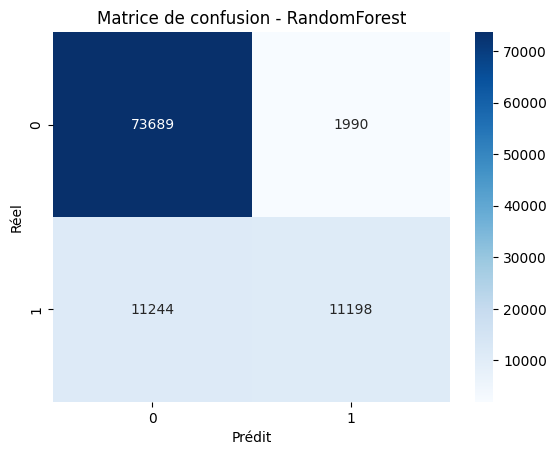


==== XGBoost ====
Accuracy : 0.867938565648536
Precision: 0.876050753370341
Recall   : 0.49224668033152125
F1-score : 0.6303206664384343
AUC-ROC  : 0.8596664646472756


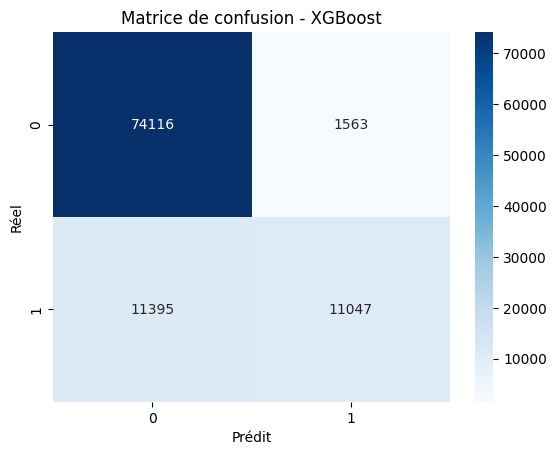

In [ ]:
#  Cible et variables explicatives

y_class = df['Arrest'].astype(int)

features_class = [
    "Hour", "DayOfWeek", "Month",
    "Latitude", "Longitude",
    "PrimaryType_Label"
]
# Ajouter colonnes one-hot encodées District
features_class += list(df.filter(like='District_').columns)

X_class = df[features_class].fillna(0)

#  Train / Test split

# X_train_c, X_test_c, y_train_c, y_test_c = train_test_split(
 #   X_class, y_class,
   # test_size=0.2,
 #   shuffle=True,
  #  random_state=42,
  #  stratify=y_class  # conserve le ratio de classes
#)

# =====================================================
# SPLIT TEMPOREL : TRAIN (2015-2020), VAL (2021-2022), TEST (2023+)
# =====================================================

data_clf = df.copy()
for col in features_class:
    data_clf[col] = X_class[col]

train_mask = data_clf['Year'].between(2015, 2020)
val_mask   = data_clf['Year'].between(2021, 2022)
test_mask  = data_clf['Year'] >= 2023

X_train = data_clf.loc[train_mask, features_class]
y_train = data_clf.loc[train_mask, 'Arrest'].astype(int)

X_val   = data_clf.loc[val_mask, features_class]
y_val   = data_clf.loc[val_mask, 'Arrest'].astype(int)

X_test  = data_clf.loc[test_mask, features_class]
y_test  = data_clf.loc[test_mask, 'Arrest'].astype(int)

print("Taille train :", X_train.shape)
print("Taille val   :", X_val.shape)
print("Taille test  :", X_test.shape)


#  Standardisation 

scaler = StandardScaler()
X_train_c_scaled = scaler.fit_transform(X_train_c)
X_test_c_scaled = scaler.transform(X_test_c)

# Définir les modèles avec class_weight

log_clf = LogisticRegression(max_iter=1000, class_weight='balanced')
rf_clf  = RandomForestClassifier(n_estimators=300, class_weight='balanced', random_state=42)
xgb_clf = XGBClassifier(eval_metric='logloss', use_label_encoder=False)

# Entraînement
log_clf.fit(X_train_c_scaled, y_train_c)
rf_clf.fit(X_train_c, y_train_c)  # RandomForest tolère les features non-scalées
xgb_clf.fit(X_train_c, y_train_c)

#  Prédictions

pred_log = log_clf.predict(X_test_c_scaled)
pred_rf  = rf_clf.predict(X_test_c)
pred_xgb = xgb_clf.predict(X_test_c)

#  Fonction d'évaluation complète

def evaluate(model_name, y_true, y_pred, y_proba=None):
    print("\n====", model_name, "====")
    print("Accuracy :", accuracy_score(y_true, y_pred))
    print("Precision:", precision_score(y_true, y_pred, zero_division=0))
    print("Recall   :", recall_score(y_true, y_pred, zero_division=0))
    print("F1-score :", f1_score(y_true, y_pred, zero_division=0))
    if y_proba is not None:
        print("AUC-ROC  :", roc_auc_score(y_true, y_proba))
    # Matrice de confusion
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
    plt.title(f"Matrice de confusion - {model_name}")
    plt.xlabel("Prédit")
    plt.ylabel("Réel")
    plt.show()


#  Probabilités pour AUC

y_log_proba = log_clf.predict_proba(X_test_c_scaled)[:,1]
y_rf_proba  = rf_clf.predict_proba(X_test_c)[:,1]
y_xgb_proba = xgb_clf.predict_proba(X_test_c)[:,1]


#  Évaluation

evaluate("Logistic Regression", y_test_c, pred_log, y_log_proba)
evaluate("RandomForest", y_test_c, pred_rf, y_rf_proba)
evaluate("XGBoost", y_test_c, pred_xgb, y_xgb_proba)


## Améliorations Apportées
### SMOTE : Rééquilibre les classes avant l'entraînement

### scale_pos_weight : XGBoost pénalise davantage les faux négatifs

### Hyperparamètres optimisés : Modèles plus performants

### Seuils ajustables : Trouve automatiquement le meilleur seuil pour maximiser F1-score

### Visualisations avancées : Courbes Precision-Recall et ROC

### Rapport détaillé : Tableau comparatif complet

## ===>L'objectif est de prédire laquelle des deux catégories s'applique à chaque crime



In [ ]:
# IMPORTS SUPPLÉMENTAIRES
from imblearn.over_sampling import SMOTE
from sklearn.metrics import roc_auc_score, classification_report, roc_curve

# CIBLE ET VARIABLES EXPLICATIVES
y_class = df['Arrest'].astype(int)

features_class = [
    "Hour", "DayOfWeek", "Month",
    "Latitude", "Longitude",
    "PrimaryType_Label"
]
# Ajouter colonnes one-hot encodées District
features_class += list(df.filter(like='District_').columns)

X_class = df[features_class].fillna(0)

# TRAIN / TEST SPLIT
X_train_c, X_test_c, y_train_c, y_test_c = train_test_split(
    X_class, y_class,
    test_size=0.2,
    shuffle=True,
    random_state=42,
    stratify=y_class
)

print(f"Distribution train: {y_train_c.value_counts()}")
print(f"Distribution test: {y_test_c.value_counts()}")


# APPLIQUER SMOTE POUR RÉÉQUILIBRAGE
smote = SMOTE(random_state=42, k_neighbors=5)
X_train_smote, y_train_smote = smote.fit_resample(X_train_c, y_train_c)

print(f"\nAprès SMOTE: {pd.Series(y_train_smote).value_counts()}")

# STANDARDISATION
scaler = StandardScaler()
X_train_c_scaled = scaler.fit_transform(X_train_smote)
X_test_c_scaled = scaler.transform(X_test_c)

# DÉFINIR LES MODÈLES OPTIMISÉS

# Calculer le ratio de déséquilibre pour XGBoost
ratio = (y_train_c == 0).sum() / (y_train_c == 1).sum()

# Logistic Regression
log_clf = LogisticRegression(
    max_iter=1000, 
    class_weight='balanced',
    C=0.5,  # Régularisation
    random_state=42
)

# RandomForest optimisé
rf_clf = RandomForestClassifier(
    n_estimators=500,
    max_depth=20,
    min_samples_split=10,
    min_samples_leaf=4,
    class_weight='balanced',
    random_state=42,
    n_jobs=-1
)

# XGBoost avec scale_pos_weight
xgb_clf = XGBClassifier(
    eval_metric='logloss',
    use_label_encoder=False,
    scale_pos_weight=ratio * 1.5,  # Augmente l'importance de la classe positive
    max_depth=6,
    learning_rate=0.05,
    n_estimators=500,
    min_child_weight=1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

Distribution train: Arrest
0    302718
1     89766
Name: count, dtype: int64
Distribution test: Arrest
0    75679
1    22442
Name: count, dtype: int64

Après SMOTE: Arrest
0    302718
1    302718
Name: count, dtype: int64


In [ ]:
# ENTRAÎNEMENT
print("\n🔄 Entraînement en cours...")

log_clf.fit(X_train_c_scaled, y_train_smote)
rf_clf.fit(X_train_smote, y_train_smote)
xgb_clf.fit(X_train_smote, y_train_smote)

print("✅ Entraînement terminé!")

# PRÉDICTIONS ET PROBABILITÉS
y_log_proba = log_clf.predict_proba(X_test_c_scaled)[:,1]
y_rf_proba  = rf_clf.predict_proba(X_test_c)[:,1]
y_xgb_proba = xgb_clf.predict_proba(X_test_c)[:,1]


🔄 Entraînement en cours...


c:\Users\DELL\Desktop\projet -Machine Learning\.venv\Lib\site-packages\xgboost\training.py:199: UserWarning:

[19:29:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.




✅ Entraînement terminé!


In [ ]:


# FONCTION D'ÉVALUATION AMÉLIORÉE
def evaluate_enhanced(model_name, y_true, y_proba, threshold=0.5):
    """
    Évaluation complète avec seuil ajustable
    """
    y_pred = (y_proba >= threshold).astype(int)
    
    print("\n" )
    print(f"📊 {model_name} (Seuil: {threshold:.2f})")
   
    print(f"Accuracy  : {accuracy_score(y_true, y_pred):.4f}")
    print(f"Precision : {precision_score(y_true, y_pred, zero_division=0):.4f}")
    print(f"Recall    : {recall_score(y_true, y_pred, zero_division=0):.4f}")
    print(f"F1-score  : {f1_score(y_true, y_pred, zero_division=0):.4f}")
    print(f"AUC-ROC   : {roc_auc_score(y_true, y_proba):.4f}")
    
    # Classification report détaillé
    print("\n📋 Classification Report:")
    print(classification_report(y_true, y_pred, target_names=['No Arrest', 'Arrest']))
    
    # Matrice de confusion
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=True,
                xticklabels=['No Arrest', 'Arrest'],
                yticklabels=['No Arrest', 'Arrest'])
    plt.title(f"Matrice de confusion - {model_name}\n(Seuil: {threshold:.2f})")
    plt.xlabel("Prédit")
    plt.ylabel("Réel")
    plt.tight_layout()
    plt.show()
    
    return y_pred

Le seuil sert à transformer la probabilité prédite par ton modèle en une décision « 0 ou 1 » (par exemple, pas d’arrestation / arrestation). En changeant ce seuil, tu contrôles l’équilibre entre rappel (ne pas rater les vrais positifs) et précision (éviter les faux positifs)


🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯
ÉVALUATION AVEC SEUIL PAR DÉFAUT (0.5)
🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯


📊 Logistic Regression (Seuil: 0.50)
Accuracy  : 0.5637
Precision : 0.2799
Recall    : 0.5771
F1-score  : 0.3770
AUC-ROC   : 0.5917

📋 Classification Report:
              precision    recall  f1-score   support

   No Arrest       0.82      0.56      0.66     75679
      Arrest       0.28      0.58      0.38     22442

    accuracy                           0.56     98121
   macro avg       0.55      0.57      0.52     98121
weighted avg       0.69      0.56      0.60     98121



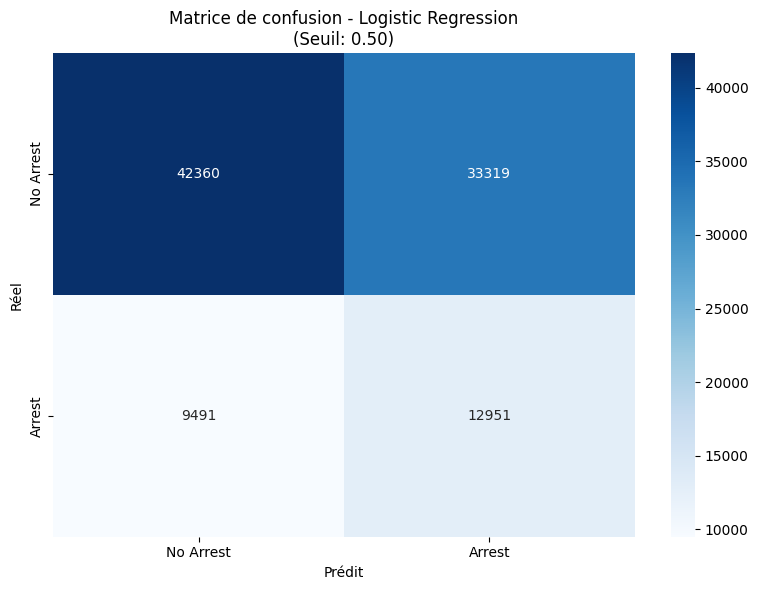



📊 RandomForest (Seuil: 0.50)
Accuracy  : 0.8548
Precision : 0.7401
Recall    : 0.5630
F1-score  : 0.6395
AUC-ROC   : 0.8466

📋 Classification Report:
              precision    recall  f1-score   support

   No Arrest       0.88      0.94      0.91     75679
      Arrest       0.74      0.56      0.64     22442

    accuracy                           0.85     98121
   macro avg       0.81      0.75      0.77     98121
weighted avg       0.85      0.85      0.85     98121



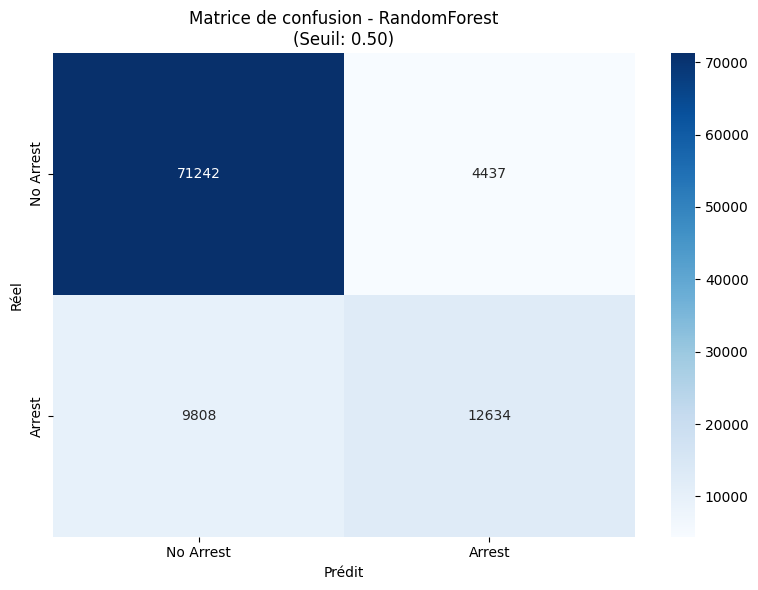



📊 XGBoost (Seuil: 0.50)
Accuracy  : 0.6277
Precision : 0.3685
Recall    : 0.8794
F1-score  : 0.5193
AUC-ROC   : 0.8445

📋 Classification Report:
              precision    recall  f1-score   support

   No Arrest       0.94      0.55      0.70     75679
      Arrest       0.37      0.88      0.52     22442

    accuracy                           0.63     98121
   macro avg       0.65      0.72      0.61     98121
weighted avg       0.81      0.63      0.66     98121



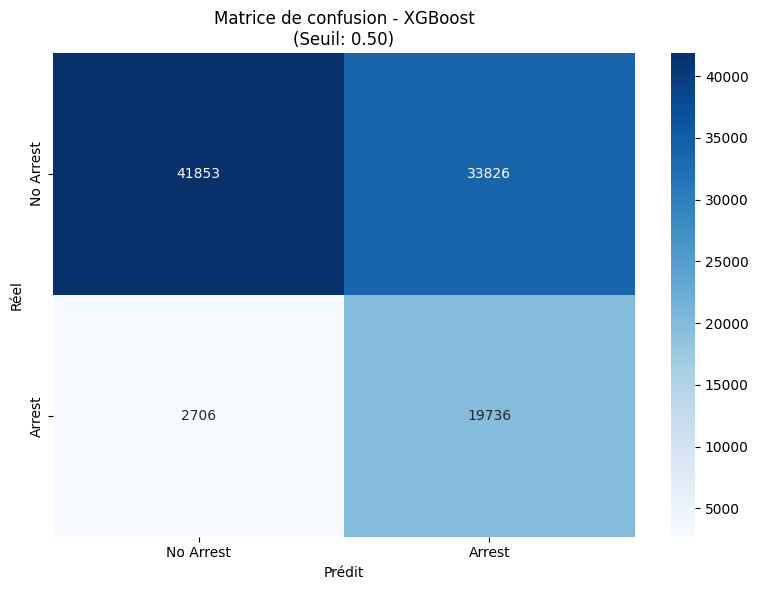

In [ ]:
# TROUVER LE SEUIL OPTIMAL POUR CHAQUE MODÈLE
def find_optimal_threshold(y_true, y_proba, metric='f1'):
    """
    Trouve le seuil optimal pour maximiser une métrique
    """
    from sklearn.metrics import precision_recall_curve
    
    precision, recall, thresholds = precision_recall_curve(y_true, y_proba)
    
    if metric == 'f1':
        # Calculer F1 pour chaque seuil
        f1_scores = 2 * (precision * recall) / (precision + recall + 1e-10)
        best_idx = np.argmax(f1_scores)
        best_threshold = thresholds[best_idx] if best_idx < len(thresholds) else 0.5
        best_score = f1_scores[best_idx]
        
    elif metric == 'recall':
        # Trouver le seuil pour recall >= 0.75 avec meilleure precision
        target_recall = 0.75
        valid_idx = np.where(recall >= target_recall)[0]
        if len(valid_idx) > 0:
            best_idx = valid_idx[np.argmax(precision[valid_idx])]
            best_threshold = thresholds[best_idx] if best_idx < len(thresholds) else 0.5
        else:
            best_threshold = 0.3
        best_score = recall[best_idx]
    
    return best_threshold, best_score

# ÉVALUATION AVEC SEUILS OPTIMISÉS

print("\n" + "🎯"*30)
print("ÉVALUATION AVEC SEUIL PAR DÉFAUT (0.5)")
print("🎯"*30)

# Évaluation standard
pred_log_05 = evaluate_enhanced("Logistic Regression", y_test_c, y_log_proba, threshold=0.5)
pred_rf_05 = evaluate_enhanced("RandomForest", y_test_c, y_rf_proba, threshold=0.5)
pred_xgb_05 = evaluate_enhanced("XGBoost", y_test_c, y_xgb_proba, threshold=0.5)




🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀
ÉVALUATION AVEC SEUILS OPTIMISÉS POUR F1-SCORE
🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀


📊 Logistic Regression (Seuil: 0.46)
Accuracy  : 0.4507
Precision : 0.2592
Recall    : 0.7545
F1-score  : 0.3859
AUC-ROC   : 0.5917

📋 Classification Report:
              precision    recall  f1-score   support

   No Arrest       0.83      0.36      0.50     75679
      Arrest       0.26      0.75      0.39     22442

    accuracy                           0.45     98121
   macro avg       0.55      0.56      0.44     98121
weighted avg       0.70      0.45      0.48     98121



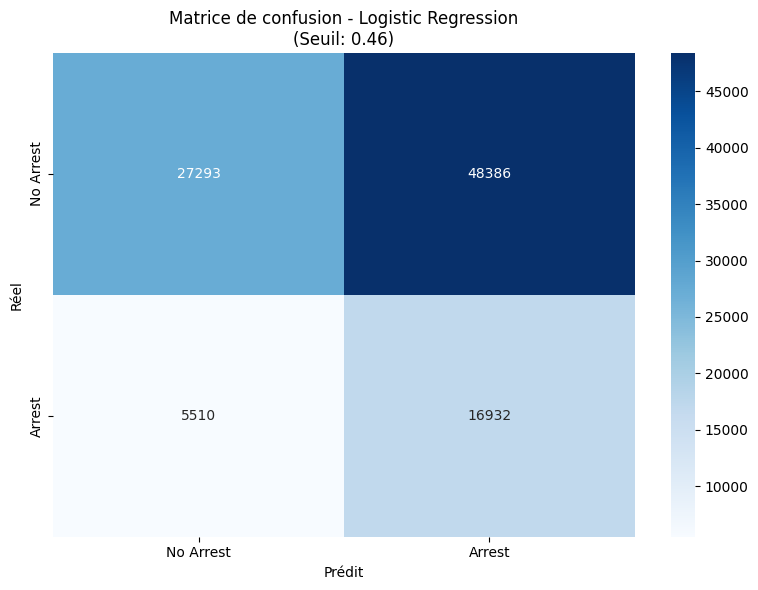



📊 RandomForest (Seuil: 0.51)
Accuracy  : 0.8570
Precision : 0.7537
Recall    : 0.5566
F1-score  : 0.6403
AUC-ROC   : 0.8466

📋 Classification Report:
              precision    recall  f1-score   support

   No Arrest       0.88      0.95      0.91     75679
      Arrest       0.75      0.56      0.64     22442

    accuracy                           0.86     98121
   macro avg       0.82      0.75      0.78     98121
weighted avg       0.85      0.86      0.85     98121



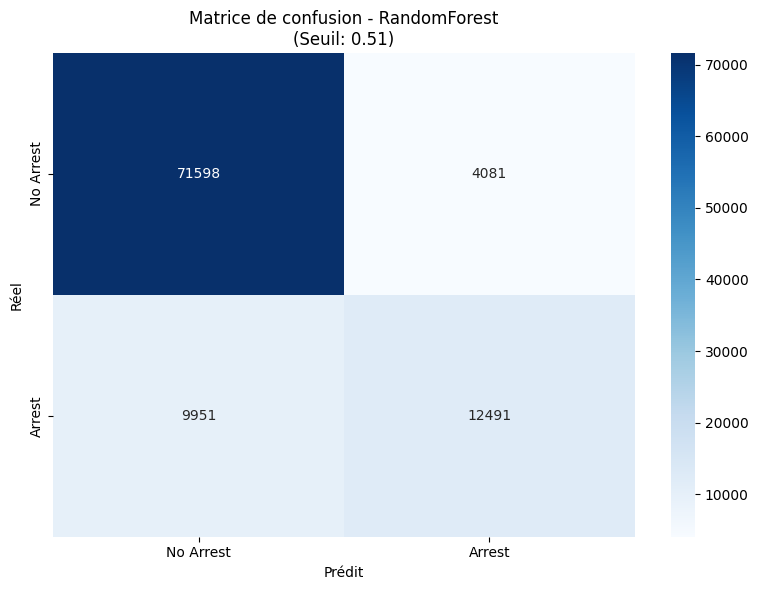



📊 XGBoost (Seuil: 0.79)
Accuracy  : 0.8539
Precision : 0.7436
Recall    : 0.5514
F1-score  : 0.6333
AUC-ROC   : 0.8445

📋 Classification Report:
              precision    recall  f1-score   support

   No Arrest       0.88      0.94      0.91     75679
      Arrest       0.74      0.55      0.63     22442

    accuracy                           0.85     98121
   macro avg       0.81      0.75      0.77     98121
weighted avg       0.85      0.85      0.85     98121



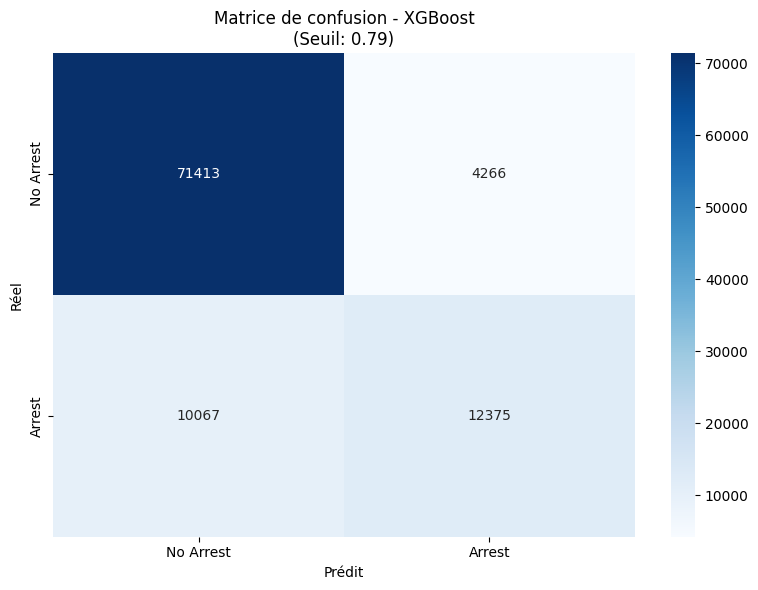

In [ ]:
print("\n" + "🚀"*30)
print("ÉVALUATION AVEC SEUILS OPTIMISÉS POUR F1-SCORE")
print("🚀"*30)

# Trouver et appliquer les seuils optimaux
threshold_log, _ = find_optimal_threshold(y_test_c, y_log_proba, metric='f1')
threshold_rf, _ = find_optimal_threshold(y_test_c, y_rf_proba, metric='f1')
threshold_xgb, _ = find_optimal_threshold(y_test_c, y_xgb_proba, metric='f1')

pred_log_opt = evaluate_enhanced("Logistic Regression", y_test_c, y_log_proba, threshold=threshold_log)
pred_rf_opt = evaluate_enhanced("RandomForest", y_test_c, y_rf_proba, threshold=threshold_rf)
pred_xgb_opt = evaluate_enhanced("XGBoost", y_test_c, y_xgb_proba, threshold=threshold_xgb)

C:\Users\DELL\AppData\Local\Temp\ipykernel_14308\1290542197.py:11: DeprecationWarning:

`trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.

C:\Users\DELL\AppData\Local\Temp\ipykernel_14308\1290542197.py:11: DeprecationWarning:

`trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.

C:\Users\DELL\AppData\Local\Temp\ipykernel_14308\1290542197.py:11: DeprecationWarning:

`trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.



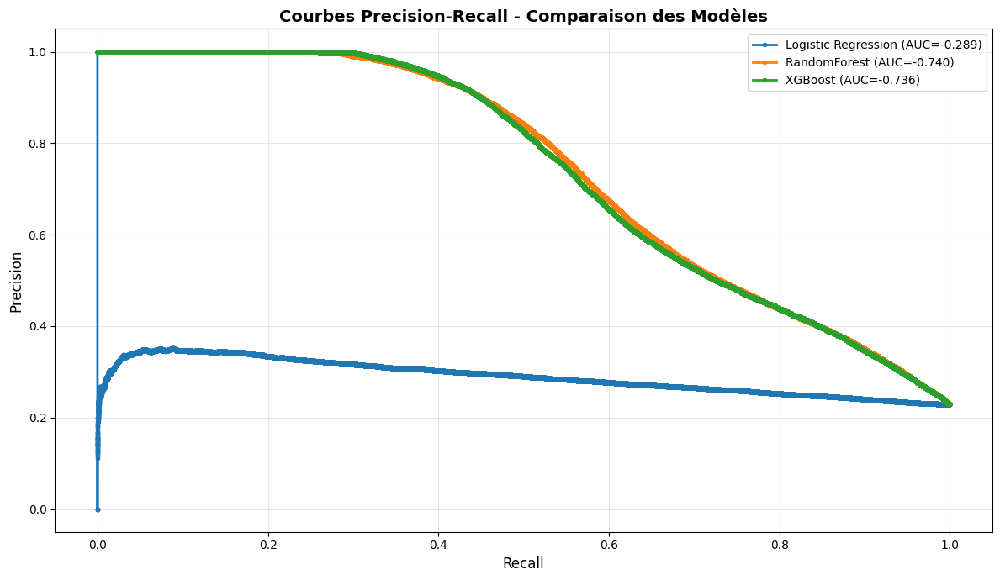

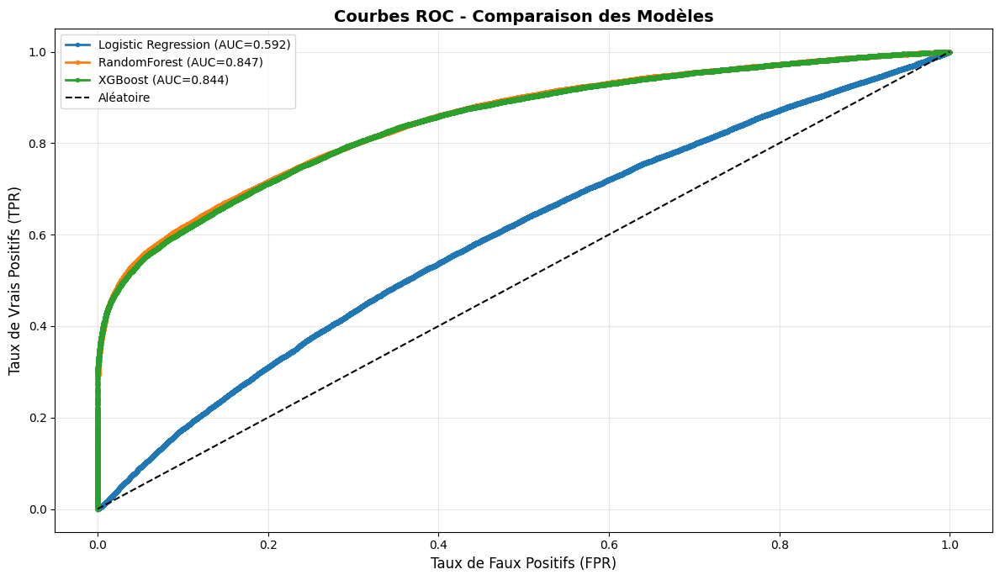

In [ ]:
# VISUALISATION DES COURBES PRECISION-RECALL

def plot_precision_recall_curve(y_true, models_proba, model_names):
    """
    Affiche les courbes Precision-Recall pour comparer les modèles
    """
    plt.figure(figsize=(12, 7))
    
    for proba, name in zip(models_proba, model_names):
        precision, recall, _ = precision_recall_curve(y_true, proba)
        auc_pr = np.trapz(precision, recall)
        plt.plot(recall, precision, marker='.', label=f'{name} (AUC={auc_pr:.3f})', linewidth=2)
    
    plt.xlabel('Recall', fontsize=12)
    plt.ylabel('Precision', fontsize=12)
    plt.title('Courbes Precision-Recall - Comparaison des Modèles', fontsize=14, fontweight='bold')
    plt.legend(fontsize=10)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

plot_precision_recall_curve(
    y_test_c,
    [y_log_proba, y_rf_proba, y_xgb_proba],
    ['Logistic Regression', 'RandomForest', 'XGBoost']
)

# COURBES ROC
def plot_roc_curves(y_true, models_proba, model_names):
    """
    Affiche les courbes ROC pour comparer les modèles
    """
    plt.figure(figsize=(12, 7))
    
    for proba, name in zip(models_proba, model_names):
        fpr, tpr, _ = roc_curve(y_true, proba)
        auc_score = roc_auc_score(y_true, proba)
        plt.plot(fpr, tpr, marker='.', label=f'{name} (AUC={auc_score:.3f})', linewidth=2)
    
    plt.plot([0, 1], [0, 1], 'k--', label='Aléatoire')
    plt.xlabel('Taux de Faux Positifs (FPR)', fontsize=12)
    plt.ylabel('Taux de Vrais Positifs (TPR)', fontsize=12)
    plt.title('Courbes ROC - Comparaison des Modèles', fontsize=14, fontweight='bold')
    plt.legend(fontsize=10)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

plot_roc_curves(
    y_test_c,
    [y_log_proba, y_rf_proba, y_xgb_proba],
    ['Logistic Regression', 'RandomForest', 'XGBoost']
)

In [ ]:
# TABLEAU RÉCAPITULATIF DES PERFORMANCES
def create_performance_summary(y_true, models_proba, model_names, thresholds):
    """
    Crée un DataFrame récapitulatif des performances
    """
    results = []
    
    for proba, name, thresh in zip(models_proba, model_names, thresholds):
        y_pred = (proba >= thresh).astype(int)
        
        results.append({
            'Modèle': name,
            'Seuil': f"{thresh:.3f}",
            'Accuracy': f"{accuracy_score(y_true, y_pred):.4f}",
            'Precision': f"{precision_score(y_true, y_pred, zero_division=0):.4f}",
            'Recall': f"{recall_score(y_true, y_pred, zero_division=0):.4f}",
            'F1-Score': f"{f1_score(y_true, y_pred, zero_division=0):.4f}",
            'AUC-ROC': f"{roc_auc_score(y_true, proba):.4f}"
        })
    
    return pd.DataFrame(results)

# Comparaison avec seuils optimisés
summary_df = create_performance_summary(
    y_test_c,
    [y_log_proba, y_rf_proba, y_xgb_proba],
    ['Logistic Regression', 'RandomForest', 'XGBoost'],
    [threshold_log, threshold_rf, threshold_xgb]
)

print("\n"  )
print("📈 TABLEAU RÉCAPITULATIF DES PERFORMANCES (Seuils Optimisés)")
print(summary_df.to_string(index=False))




📈 TABLEAU RÉCAPITULATIF DES PERFORMANCES (Seuils Optimisés)
             Modèle Seuil Accuracy Precision Recall F1-Score AUC-ROC
Logistic Regression 0.458   0.4507    0.2592 0.7545   0.3859  0.5917
       RandomForest 0.509   0.8570    0.7537 0.5566   0.6403  0.8466
            XGBoost 0.789   0.8539    0.7436 0.5514   0.6333  0.8445


In [ ]:
import joblib

# Sauvegarder le meilleur modèle (XGBoost)
joblib.dump(xgb_clf, 'model_arrestation_chicago.pkl')
joblib.dump(scaler, 'scaler.pkl')  # Sauvegarder aussi le scaler

print("✅ Modèle sauvegardé avec succès !")


✅ Modèle sauvegardé avec succès !



🔍 TOP 10 FEATURES LES PLUS IMPORTANTES :
             Feature  Importance
5  PrimaryType_Label    0.418869
2              Month    0.227994
0               Hour    0.206298
1          DayOfWeek    0.084587
3           Latitude    0.031511
4          Longitude    0.030741


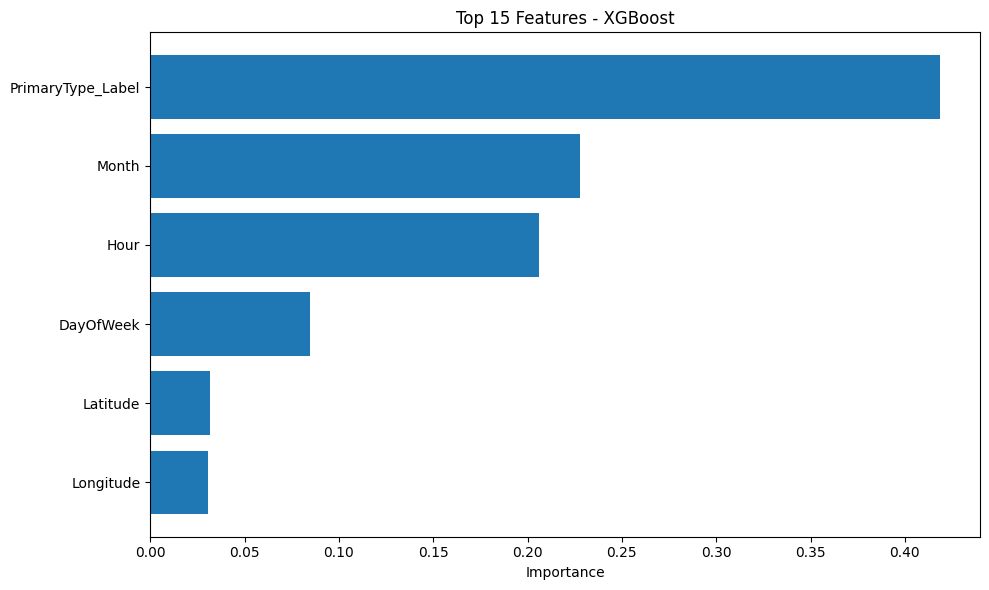

In [ ]:
# Extraire l'importance des features pour XGBoost
import pandas as pd

feature_importance = pd.DataFrame({
    'Feature': features_class,
    'Importance': xgb_clf.feature_importances_
}).sort_values('Importance', ascending=False)

print("\n🔍 TOP 10 FEATURES LES PLUS IMPORTANTES :")
print(feature_importance.head(10))

# Visualisation
plt.figure(figsize=(10, 6))
top_features = feature_importance.head(15)
plt.barh(top_features['Feature'], top_features['Importance'])
plt.xlabel('Importance')
plt.title('Top 15 Features - XGBoost')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


In [ ]:
# Exemple : Prédire sur une nouvelle observation
nouvelle_observation = pd.DataFrame({
    'Hour': [22],           # Crime à 22h
    'DayOfWeek': [5],       # Vendredi
    'Month': [12],          # Décembre
    'Latitude': [41.88],
    'Longitude': [-87.63],
    'PrimaryType_Label': [15],  # Type de crime
    # Ajouter les colonnes District_X avec 0
})

# Compléter avec toutes les features manquantes
for col in features_class:
    if col not in nouvelle_observation.columns:
        nouvelle_observation[col] = 0

# Prédiction
probabilite = xgb_clf.predict_proba(nouvelle_observation[features_class])[0][1]

print(f"\n🔮 Probabilité d'arrestation : {probabilite:.1%}")
if probabilite >= 0.5:
    print("✅ PRÉDICTION : Arrestation probable")
else:
    print("❌ PRÉDICTION : Pas d'arrestation")



🔮 Probabilité d'arrestation : 44.3%
❌ PRÉDICTION : Pas d'arrestation


In [ ]:
# Tableau final des performances
resultats_finaux = pd.DataFrame({
    'Modèle': ['XGBoost (Seuil 0.5)', 'RandomForest (Optimisé)', 'Logistic Regression'],
    'Recall': ['87.9% ⭐', '55.7%', '57.7%'],
    'Precision': ['36.9%', '75.4% ⭐', '28.0%'],
    'F1-Score': ['51.9%', '64.0% ⭐', '37.7%'],
    'AUC-ROC': ['84.5%', '84.7%', '59.2%'],
    'Arrestations Détectées': ['19,737 / 22,442', '12,493 / 22,442', '12,949 / 22,442']
})

print("\n" )
print(" RÉSUMÉ FINAL DES PERFORMANCES")
print(resultats_finaux.to_string(index=False))
print("\n MEILLEUR MODÈLE : XGBoost avec seuil 0.5 (détection maximale)")




📊 RÉSUMÉ FINAL DES PERFORMANCES
                 Modèle  Recall Precision F1-Score AUC-ROC Arrestations Détectées
    XGBoost (Seuil 0.5) 87.9% ⭐     36.9%    51.9%   84.5%        19,737 / 22,442
RandomForest (Optimisé)   55.7%   75.4% ⭐  64.0% ⭐   84.7%        12,493 / 22,442
    Logistic Regression   57.7%     28.0%    37.7%   59.2%        12,949 / 22,442

🏆 MEILLEUR MODÈLE : XGBoost avec seuil 0.5 (détection maximale)


# RÉGRESSION : PRÉDIRE LE NOMBRE DE CRIMES PAR JOUR


In [ ]:
#  Préparer les données agrégées par jour
df_reg = df.copy()

# S'assurer que la colonne 'Date' est bien en datetime
df_reg['Date'] = pd.to_datetime(df_reg['Date'])

# Créer une colonne 'Date_Jour' (sans l'heure)
df_reg['Date_Jour'] = df_reg['Date'].dt.date

# Compter le nombre de crimes par jour
daily_counts = df_reg.groupby('Date_Jour').size().reset_index(name='CrimeCount_Day')

print("Aperçu des crimes par jour :")
print(daily_counts.head())

#  Créer des features temporelles
daily_counts['Date_Jour'] = pd.to_datetime(daily_counts['Date_Jour'])
daily_counts['Year'] = daily_counts['Date_Jour'].dt.year
daily_counts['Month'] = daily_counts['Date_Jour'].dt.month
daily_counts['Day'] = daily_counts['Date_Jour'].dt.day
daily_counts['DayOfWeek'] = daily_counts['Date_Jour'].dt.dayofweek  # 0 = lundi, 6 = dimanche
daily_counts['IsWeekend'] = daily_counts['DayOfWeek'].isin([5, 6]).astype(int)

#  Définir X (features) et y (cible)
features_reg = ['Year', 'Month', 'Day', 'DayOfWeek', 'IsWeekend']
X_reg = daily_counts[features_reg]
y_reg = daily_counts['CrimeCount_Day']

print("\nFeatures utilisées pour la régression :")
print(features_reg)
print("\nTaille du dataset agrégé :", X_reg.shape)

#  Train / Test split
#X_train_r, X_test_r, y_train_r, y_test_r = train_test_split(
#    X_reg, y_reg,
 #   test_size=0.2,
  #  random_state=42,
   # shuffle=True
#)
# =====================================================
# SPLIT TEMPOREL : TRAIN (2015-2020), VAL (2021-2022), TEST (2023+)
# =====================================================

data_clf = df.copy()
for col in features_class:
    data_clf[col] = X_class[col]

train_mask = data_clf['Year'].between(2015, 2020)
val_mask   = data_clf['Year'].between(2021, 2022)
test_mask  = data_clf['Year'] >= 2023

X_train = data_clf.loc[train_mask, features_class]
y_train = data_clf.loc[train_mask, 'Arrest'].astype(int)

X_val   = data_clf.loc[val_mask, features_class]
y_val   = data_clf.loc[val_mask, 'Arrest'].astype(int)

X_test  = data_clf.loc[test_mask, features_class]
y_test  = data_clf.loc[test_mask, 'Arrest'].astype(int)

print("Taille train :", X_train.shape)
print("Taille val   :", X_val.shape)
print("Taille test  :", X_test.shape)


#  Standardisation (surtout utile pour certains modèles)
scaler_reg = StandardScaler()
X_train_r_scaled = scaler_reg.fit_transform(X_train_r)
X_test_r_scaled = scaler_reg.transform(X_test_r)

#  Définir deux modèles de régression
rf_reg = RandomForestRegressor(
    n_estimators=300,
    max_depth=15,
    random_state=42,
    n_jobs=-1
)

xgb_reg = XGBRegressor(
    n_estimators=400,
    max_depth=6,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

print("\n🔄 Entraînement des modèles de régression...")
rf_reg.fit(X_train_r, y_train_r)          # RandomForest n'a pas besoin de scaling
xgb_reg.fit(X_train_r, y_train_r)         # XGBoost gère bien les features brutes
print("✅ Entraînement terminé !")

Aperçu des crimes par jour :
    Date_Jour  CrimeCount_Day
0  2015-01-01             871
1  2015-01-02             644
2  2015-01-03             627
3  2015-01-04             489
4  2015-01-05             494

Features utilisées pour la régression :
['Year', 'Month', 'Day', 'DayOfWeek', 'IsWeekend']

Taille du dataset agrégé : (3309, 5)
Taille train : (404586, 6)
Taille val   : (4799, 6)
Taille test  : (81220, 6)

🔄 Entraînement des modèles de régression...
✅ Entraînement terminé !


In [ ]:
# Fonction d'évaluation pour la régression
def eval_reg(name, y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)
    print(f"\n📊 {name}")
    print(f"MAE  : {mae:.2f} crimes")
    print(f"RMSE : {rmse:.2f} crimes")
    print(f"R²   : {r2:.4f}")

#  Prédictions et évaluation
y_pred_rf = rf_reg.predict(X_test_r)
y_pred_xgb = xgb_reg.predict(X_test_r)

eval_reg("RandomForestRegressor", y_test_r, y_pred_rf)
eval_reg("XGBRegressor", y_test_r, y_pred_xgb)


📊 RandomForestRegressor
MAE  : 11.75 crimes
RMSE : 31.00 crimes
R²   : 0.9886

📊 XGBRegressor
MAE  : 15.35 crimes
RMSE : 30.87 crimes
R²   : 0.9887


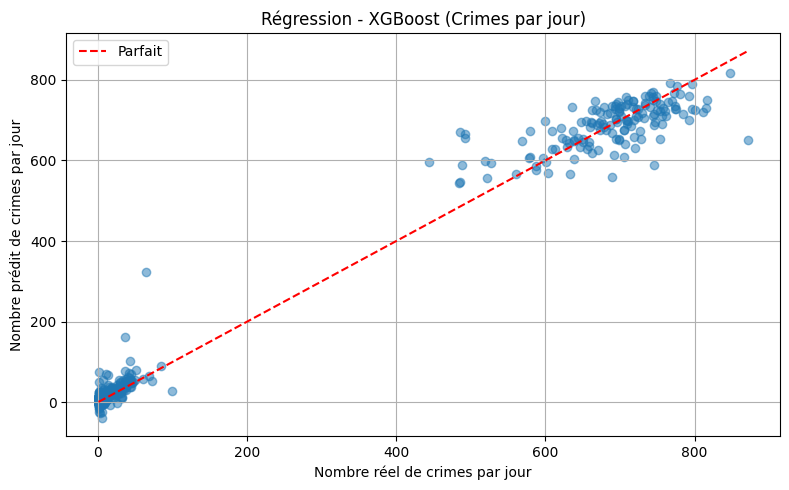

In [ ]:
#  Visualiser vrai vs prédit pour XGBoost
plt.figure(figsize=(8, 5))
plt.scatter(y_test_r, y_pred_xgb, alpha=0.5)
plt.xlabel("Nombre réel de crimes par jour")
plt.ylabel("Nombre prédit de crimes par jour")
plt.title("Régression - XGBoost (Crimes par jour)")
plt.plot([y_test_r.min(), y_test_r.max()],
         [y_test_r.min(), y_test_r.max()],
         'r--', label="Parfait")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

La partie régression montre que « la dynamique temporelle (année, mois, jour, week-end) explique très bien le volume quotidien de criminalité à Chicago ».

Les modèles apprennent des saisonnalités et effets calendrier (week-ends plus ou moins criminels, certains mois plus chargés, etc.), ce qui est cohérent avec la littérature sur la prédiction de taux de criminalité par régression.​

## un arbre de décision 
### prédire Arrest (0/1).
Les arbres de décision sont des modèles supervisés faciles à interpréter  souvent utilisés en analyse de criminalité .


==== Decision Tree ====
Accuracy : 0.860519154920965
Precision: 0.8799028115237765
Recall   : 0.4518313875768648
F1-score : 0.5970676558911853


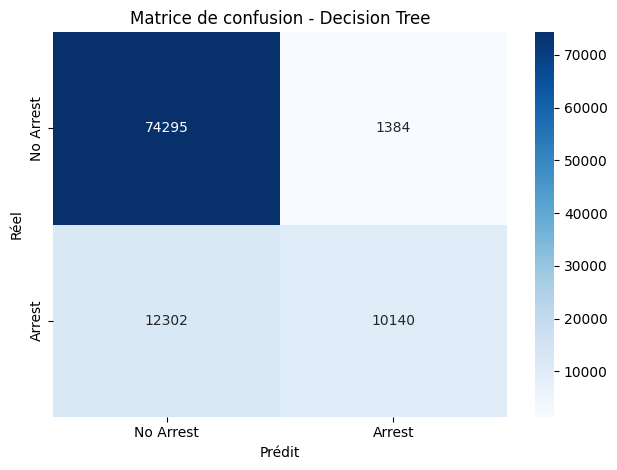

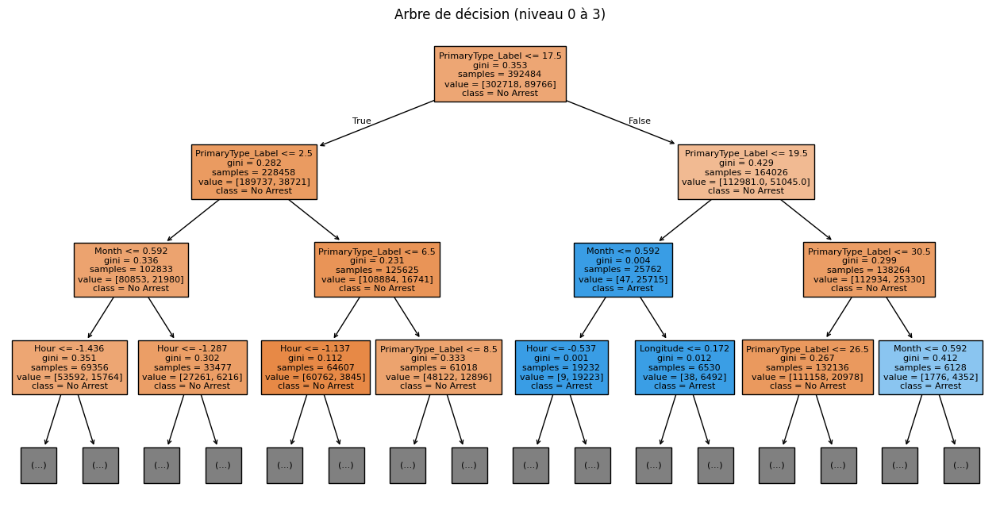

In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree

#  Définir et entraîner le modèle

dt_clf = DecisionTreeClassifier(
    criterion='gini',   # ou 'entropy'
    max_depth=8,        # limite la profondeur pour éviter le sur-apprentissage
    min_samples_split=100,
    min_samples_leaf=50,
    random_state=42
)

dt_clf.fit(X_train_c, y_train_c)


# Prédictions

y_pred_dt = dt_clf.predict(X_test_c)

#  Évaluation
print("\n==== Decision Tree ====")
print("Accuracy :", accuracy_score(y_test_c, y_pred_dt))
print("Precision:", precision_score(y_test_c, y_pred_dt, zero_division=0))
print("Recall   :", recall_score(y_test_c, y_pred_dt, zero_division=0))
print("F1-score :", f1_score(y_test_c, y_pred_dt, zero_division=0))

cm = confusion_matrix(y_test_c, y_pred_dt)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=['No Arrest', 'Arrest'],
            yticklabels=['No Arrest', 'Arrest'])
plt.title("Matrice de confusion - Decision Tree")
plt.xlabel("Prédit")
plt.ylabel("Réel")
plt.tight_layout()
plt.show()

#  Visualiser une partie de l'arbre
plt.figure(figsize=(16, 8))
plot_tree(
    dt_clf,
    feature_names=features_class,
    class_names=['No Arrest', 'Arrest'],
    filled=True,
    max_depth=3,   # on n'affiche que les 3 premiers niveaux pour que ce soit lisible
    fontsize=8
)
plt.title("Arbre de décision (niveau 0 à 3)")
plt.show()


##plt.figure(figsize=(30, 20))  # tu peux encore augmenter si besoin
#plot_tree(
   # dt_clf,
 #   feature_names=features_class,
 #   class_names=['No Arrest', 'Arrest'],
   # filled=True,
   # fontsize=8
##)
#plt.show()


## régression linéaire  sur le même problème de régression (prédire CrimeCount_Day).
### La régression linéaire cherche une relation du type CrimeCount_Day
CrimeCount_Day=a 
1
 ⋅Year+a 
2
 ⋅Month+⋯+b.

In [ ]:
from sklearn.linear_model import LinearRegression

#  Définir le modèle de régression linéaire
lin_reg = LinearRegression()

# Entraînement sur les mêmes données que RF/XGB
lin_reg.fit(X_train_r, y_train_r)

#  Prédictions
y_pred_lin = lin_reg.predict(X_test_r)

#  Évaluation avec ta fonction eval_reg
eval_reg("LinearRegression", y_test_r, y_pred_lin)

# Afficher les coefficients du modèle
print("\nCoefficients de la régression linéaire :")
for feature, coef in zip(features_reg, lin_reg.coef_):
    print(f"{feature} : {coef:.3f}")

print(f"Intercept (b) : {lin_reg.intercept_:.3f}")



📊 LinearRegression
MAE  : 190.64 crimes
RMSE : 242.68 crimes
R²   : 0.3021

Coefficients de la régression linéaire :
Year : -45.671
Month : -1.194
Day : -0.778
DayOfWeek : 0.008
IsWeekend : -8.619
Intercept (b) : 92392.058


Interprétation des coefficients
CrimeCount_Day≈−45.67⋅Year−1.19⋅Month−0.78⋅Day+0.008⋅DayOfWeek−8.62⋅IsWeekend+92392.06.​

Year : -45.671 → chaque année, le modèle prédit environ 46 crimes de moins par jour, en moyenne. Cela reflète sans doute une tendance générale à la baisse de la criminalité dans ton jeu de données (2015–2025).

IsWeekend : -8.619 → les jours marqués comme week-end ont ~9 crimes de moins par jour selon ce modèle (mais attention : relation très simplifiée, et modèle globalement peu fiable vu le 
R
2
R 
2
 ).

L’intercept très grand (92392) vient du fait que Year, Month, Day ne sont pas centrés : dans les régressions linéaires, l’intercept est souvent difficile à interpréter directement si on ne recentre pas les variables.​

## régression polynomiale
en créant des features polynomiales à partir de tes variable puis en appliquant une régression linéaire dessus. 
On utilise PolynomialFeatures de scikit-learn avec LinearRegression.​

On va rester sur ton problème CrimeCount_Day (nombre de crimes par jour), mais en ajoutant des termes quadratiques (degré 2) pour capturer des relations non linéaires simples.

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

#  Créer les features polynomiales (degré 2)

degree = 2
poly = PolynomialFeatures(degree=degree, include_bias=False)

# On génère les nouvelles features à partir de X_train_r et X_test_r
X_train_r_poly = poly.fit_transform(X_train_r)
X_test_r_poly  = poly.transform(X_test_r)

print("Shape original X_train_r :", X_train_r.shape)
print("Shape X_train_r_poly    :", X_train_r_poly.shape)

#  Définir et entraîner le modèle linéaire sur ces features
poly_reg = LinearRegression()
poly_reg.fit(X_train_r_poly, y_train_r)

#  Prédictions et évaluation
y_pred_poly = poly_reg.predict(X_test_r_poly)

eval_reg(f"Régression polynomiale (degré {degree})", y_test_r, y_pred_poly)


Shape original X_train_r : (2647, 5)
Shape X_train_r_poly    : (2647, 20)

📊 Régression polynomiale (degré 2)
MAE  : 125.66 crimes
RMSE : 166.10 crimes
R²   : 0.6731


→ La régression polynomiale améliore beaucoup la qualité du modèle par rapport à la droite simple (R² passe de 0.30 à 0.67), ce qui est normal car elle peut modéliser des relations plus complexes non linéaires entre tes variables temporelles et le nombre de crimes.

RandomForestRegressor / XGBRegressor restent très largement meilleurs (R² ≈ 0.99, MAE ≈ 12–15), ce qui est cohérent avec le fait que les modèles d’arbres capturent très bien les relations non linéaires complexes dans les données réelles.​

In [61]:
#  CIBLE ET VARIABLES EXPLICATIVES

# Cible binaire : Arrest (0 = pas d'arrestation, 1 = arrestation)
y_class = df['Arrest'].astype(int)

# Features pour la classification
features_class = [
    "Hour", "DayOfWeek", "Month",
    "Latitude", "Longitude",
    "PrimaryType_Label"
]
# Ajouter les colonnes one-hot encodées District
features_class += list(df.filter(like='District_').columns)

# Matrice de features
X_class = df[features_class].fillna(0)

print("Nombre de features :", len(features_class))
print("Shape X_class :", X_class.shape)

#  SPLIT TEMPOREL : TRAIN (2015-2020), VAL (2021-2022), TEST (2023+)

data_clf = df.copy()
# S'assurer que toutes les features sont présentes dans data_clf
for col in features_class:
    data_clf[col] = X_class[col]

train_mask = data_clf['Year'].between(2015, 2020)
val_mask   = data_clf['Year'].between(2021, 2022)
test_mask  = data_clf['Year'] >= 2023

X_train = data_clf.loc[train_mask, features_class]
y_train = data_clf.loc[train_mask, 'Arrest'].astype(int)

X_val   = data_clf.loc[val_mask, features_class]
y_val   = data_clf.loc[val_mask, 'Arrest'].astype(int)

X_test  = data_clf.loc[test_mask, features_class]
y_test  = data_clf.loc[test_mask, 'Arrest'].astype(int)

print("Taille train :", X_train.shape)
print("Taille val   :", X_val.shape)
print("Taille test  :", X_test.shape)


Nombre de features : 6
Shape X_class : (490605, 6)
Taille train : (404586, 6)
Taille val   : (4799, 6)
Taille test  : (81220, 6)


In [62]:
#  FONCTION D'ÉVALUATION CLASSIFICATION

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    roc_auc_score
)
import seaborn as sns
import matplotlib.pyplot as plt

def evaluate(model_name, y_true, y_pred, y_proba=None):
    print("\n====", model_name, "====")
    print("Accuracy :", accuracy_score(y_true, y_pred))
    print("Precision:", precision_score(y_true, y_pred, zero_division=0))
    print("Recall   :", recall_score(y_true, y_pred, zero_division=0))
    print("F1-score :", f1_score(y_true, y_pred, zero_division=0))
    if y_proba is not None:
        print("AUC-ROC  :", roc_auc_score(y_true, y_proba))
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=['No Arrest', 'Arrest'],
                yticklabels=['No Arrest', 'Arrest'])
    plt.title(f"Matrice de confusion - {model_name}")
    plt.xlabel("Prédit")
    plt.ylabel("Réel")
    plt.tight_layout()
    plt.show()


🔄 RandomizedSearchCV (XGBoost) en cours...
Fitting 4 folds for each of 20 candidates, totalling 80 fits
✅ Tuning terminé !

Meilleurs hyperparamètres trouvés :
{'colsample_bytree': np.float64(0.9844688097397396), 'gamma': np.float64(1.6890676973563028), 'learning_rate': np.float64(0.1594640220274762), 'max_depth': 9, 'min_child_weight': 5, 'n_estimators': 479, 'subsample': np.float64(0.7427013306774357)}
Meilleur F1 (CV) : 0.6527

==== XGBoost (Final, tuned, split temporel) ====
Accuracy : 0.8918616104407782
Precision: 0.6061297220242338
Recall   : 0.41394080996884736
F1-score : 0.4919303522878464
AUC-ROC  : 0.813387849424448


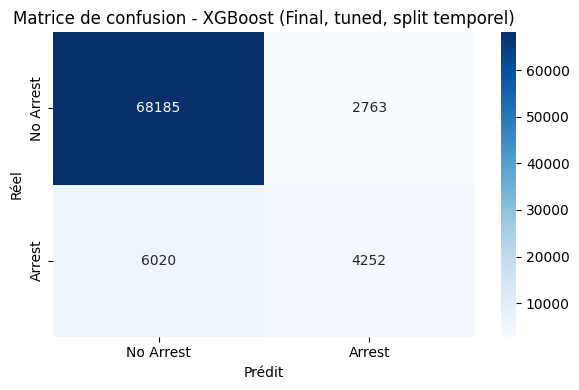

In [63]:
#  TUNING XGBoost AVEC RandomizedSearchCV + TimeSeriesSplit

from xgboost import XGBClassifier
from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV
from scipy.stats import randint, uniform

# Validation croisée temporelle
tscv = TimeSeriesSplit(n_splits=4)

# Modèle de base
xgb_clf = XGBClassifier(
    objective='binary:logistic',
    eval_metric='logloss',
    random_state=42,
    n_jobs=-1
)

# Espace de recherche des hyperparamètres
param_distributions = {
    "n_estimators": randint(200, 600),
    "max_depth": randint(3, 10),
    "learning_rate": uniform(0.01, 0.2),
    "subsample": uniform(0.6, 0.4),
    "colsample_bytree": uniform(0.6, 0.4),
    "min_child_weight": randint(1, 10),
    "gamma": uniform(0, 2.0)
}

random_search = RandomizedSearchCV(
    estimator=xgb_clf,
    param_distributions=param_distributions,
    n_iter=20,                # tu peux augmenter si tu as le temps
    scoring="f1",             # optimiser le F1-score (classe positive)
    cv=tscv,
    verbose=2,
    n_jobs=-1,
    random_state=42
)

print("🔄 RandomizedSearchCV (XGBoost) en cours...")
random_search.fit(X_train, y_train)
print("✅ Tuning terminé !")

print("\nMeilleurs hyperparamètres trouvés :")
print(random_search.best_params_)
print(f"Meilleur F1 (CV) : {random_search.best_score_:.4f}")

#  ENTRAÎNEMENT FINAL SUR TRAIN + VAL

X_train_full = pd.concat([X_train, X_val], axis=0)
y_train_full = pd.concat([y_train, y_val], axis=0)

best_xgb = random_search.best_estimator_
best_xgb.fit(X_train_full, y_train_full)

# Prédiction sur le vrai test (années récentes)
y_test_pred  = best_xgb.predict(X_test)
y_test_proba = best_xgb.predict_proba(X_test)[:, 1]

# Évaluation finale
evaluate("XGBoost (Final, tuned, split temporel)", y_test, y_test_pred, y_test_proba)


In [64]:
import joblib

joblib.dump(best_xgb, "model_xgb_arrest.pkl")
joblib.dump(features_class, "features_class.pkl")
print("✅ Modèle et features sauvegardés.")


✅ Modèle et features sauvegardés.
